In [2]:
#%matplotlib notebook
import sys
import os
#messi
# Standard modules used through the notebook 
import numpy as np
import matplotlib.pyplot as plt

# Tools specific for this tutorial
# They are in the .py files accompaining this notebook 
import ba_utils               # bundle adjustment tools
import vistools               # display tools
import utils                  # IO tools
import srtm4                  # SRTM tools
import rectification          # rectification tools
import stereo                 # stereo tools
import triangulation          # triangulation tools
from vistools import printbf  # boldface print

import s2p
import pickle 

# Display and interface settings (just for the notebook interface)
%load_ext autoreload
%autoreload 2
np.set_printoptions(linewidth=150)

In [3]:
ALL_PIPELINE = True

cam_model = 'Affine'

rpcs_from_images = True

check_triangulation_err = False
sift_point_clouds = False
save_adj_rpcs = False

# select which feature track construction pipeline you want to use
feature_tracks_1 = False
feature_tracks_2 = True
feature_tracks_3 = False

print('Global variables defined')

Global variables defined


### Load Data IARPA

Found 47 images
Number of images to be used: 47
Finished loading RPC coefficients
Finished cropping the AOI in each image



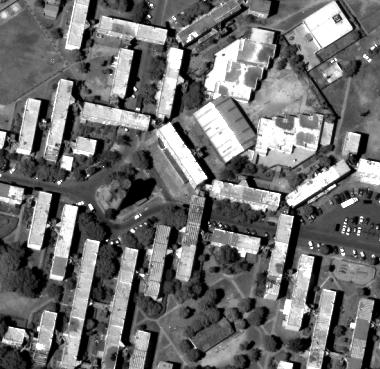
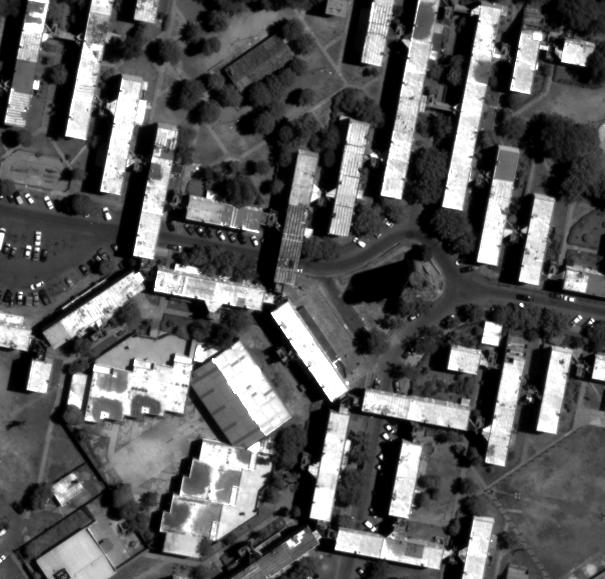
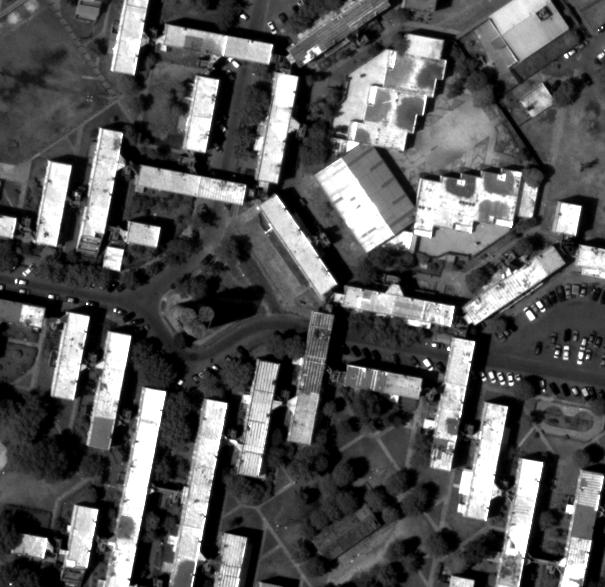
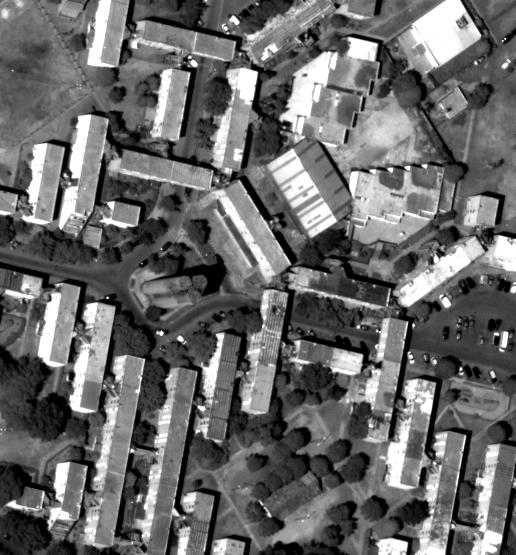
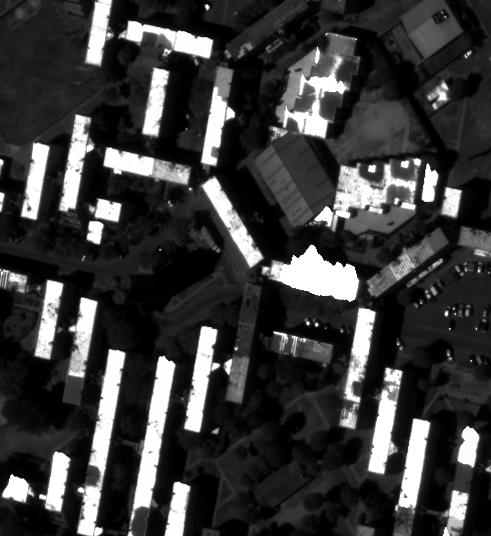
...
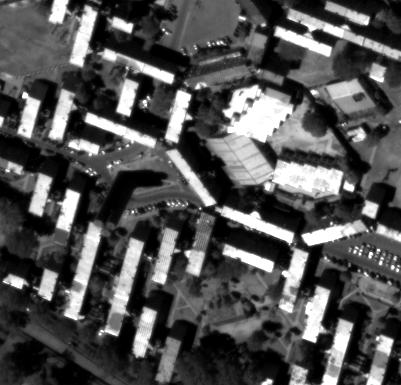
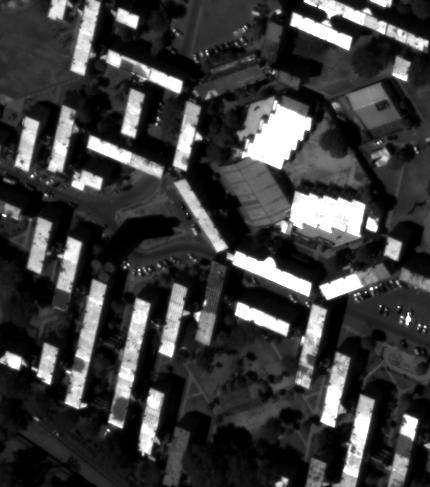
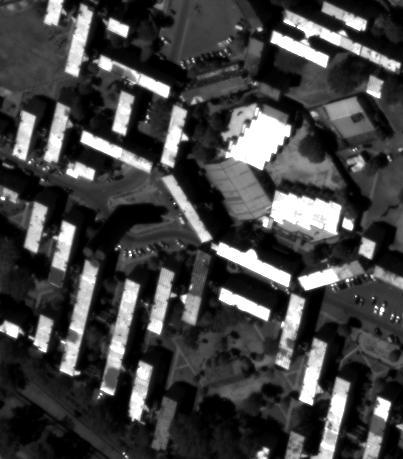
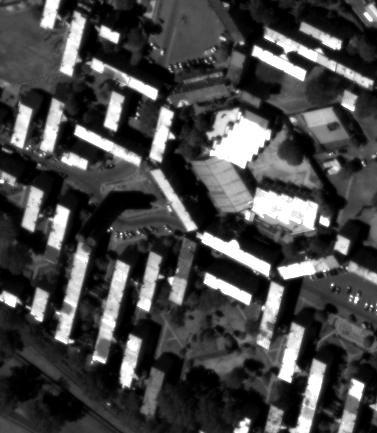
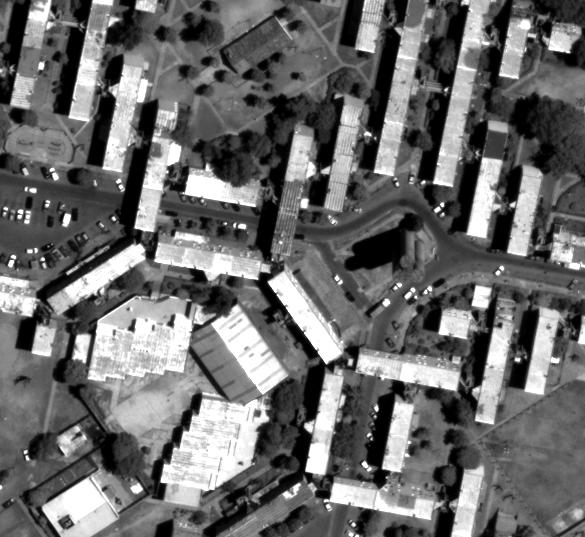

In [4]:
rpcs_from_images = True

# load images from folder and rpcs from TXT
exp_name = 'iccv19/iarpa_test'
input_dir = os.path.join('ba_experiments/',exp_name)

# list the tiff images available in the remote folder
IARPAurl = 'http://menthe.ovh.hw.ipol.im:80/IARPA_data/cloud_optimized_geotif'
myimages = utils.listFD(IARPAurl, 'TIF')

# sort the images by acquisition date
myimages = sorted(myimages, key=utils.acquisition_date)
myimages.pop(11)
myimages.pop(13)
myimages.pop(19)
print('Found {} images'.format(len(myimages)))

# select the number of cameras for the current run
n_cam = len(myimages)
print('Number of images to be used:', n_cam)

# load RPC coefficients
if not rpcs_from_images:
    #myrpcs = [rpc_model.RPCModel(os.path.splitext(im)[0]+'_rpc.txt') for im in myimages]
    myrpcs = [s2p.rpc_model.RPCModel(os.path.splitext(im)[0]+'_RPC.TXT') for im in myimages]
else:
    myrpcs = [s2p.rpc_utils.rpc_from_geotiff(x) for x in myimages]
print('Finished loading RPC coefficients')

# set the coordinates of the area of interest as a GeoJSON polygon (Buenos aires AOI)
aoi = {'coordinates': [[[-58.585185, -34.490883], [-58.585185, -34.48922 ], [-58.583104, -34.48922 ],
                                     [-58.583104, -34.490883], [-58.585185, -34.490883]]], 'type': 'Polygon'}
aoi['center'] = np.mean(aoi['coordinates'][0][:4], axis=0).tolist() # add center field

# get the altitude of the center of the AOI
lon, lat = aoi['center']
z = srtm4.srtm4(lon, lat)

# crop the selected AOI in each image
mycrops, im = [], []
for f in range(len(myimages)):
    crop, x0, y0 = utils.crop_aoi(myimages[f], aoi, z)
    mycrops.append({ 'crop': utils.simple_equalization_8bit(crop), 'x0': x0, 'y0': y0 })
    im.append(utils.simple_equalization_8bit(crop))
print('Finished cropping the AOI in each image')
vistools.display_gallery(im)

### Load Data Jacksonville

Number of images to be used: 26
Finished loading RPC coefficients
Finished cropping the AOI in each image



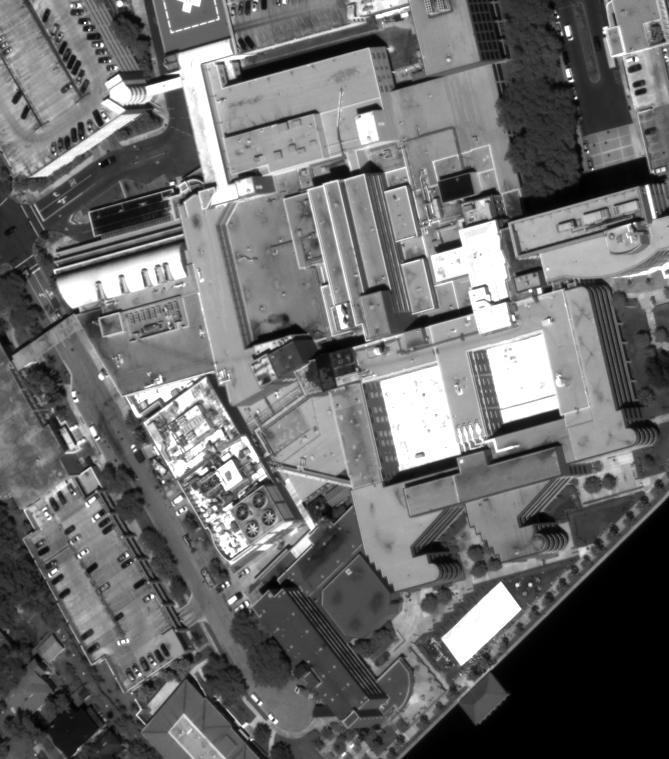
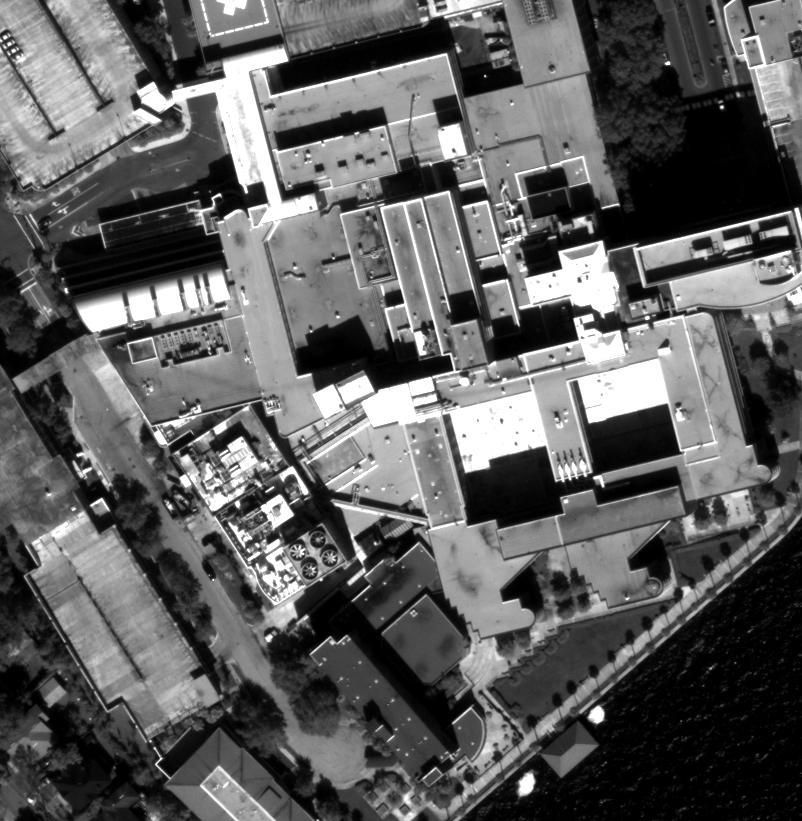
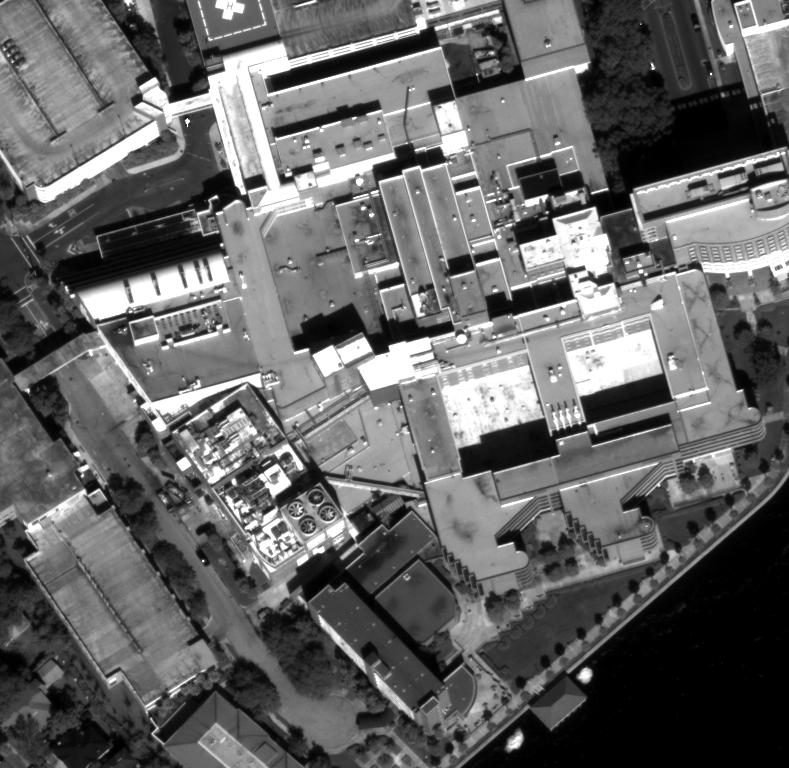
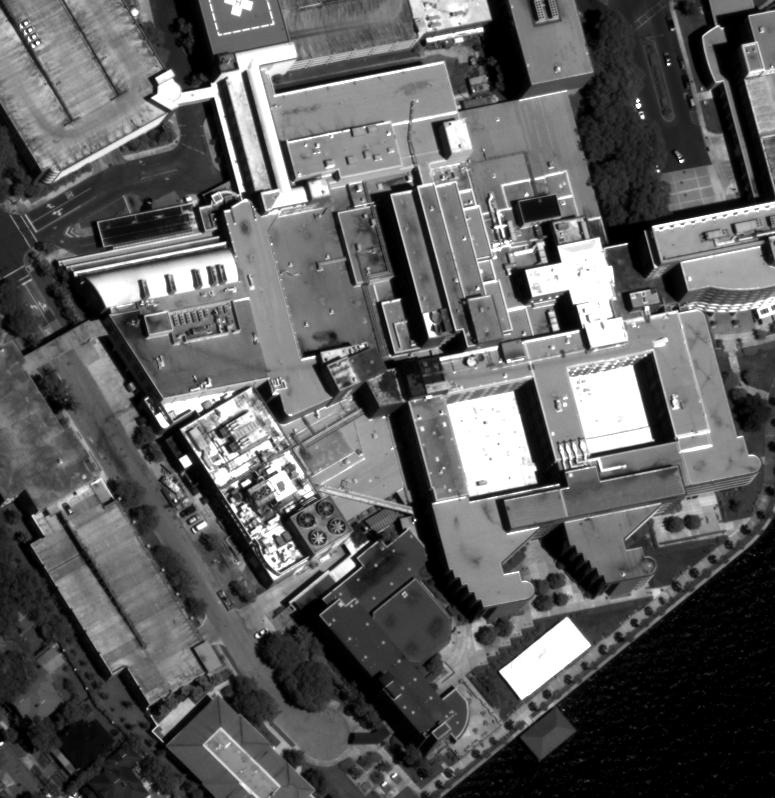
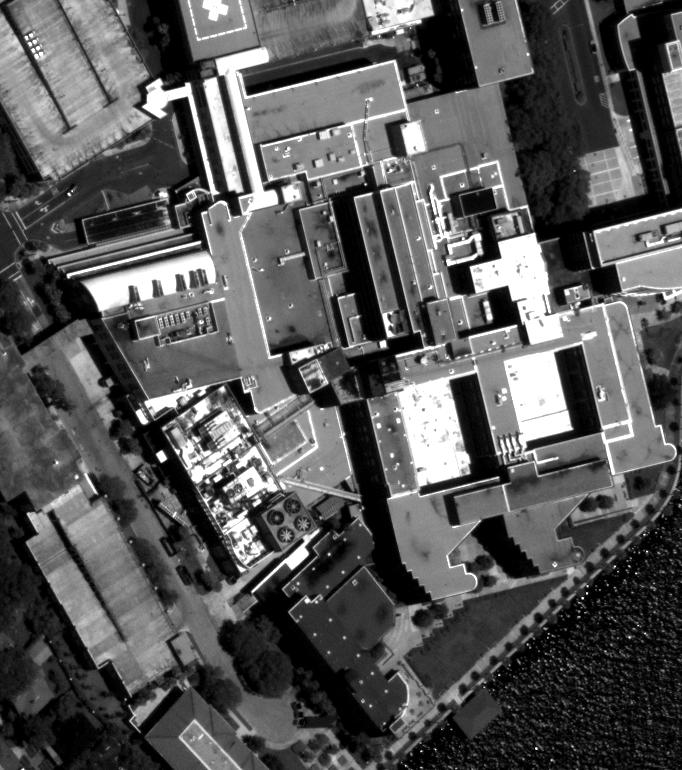
...
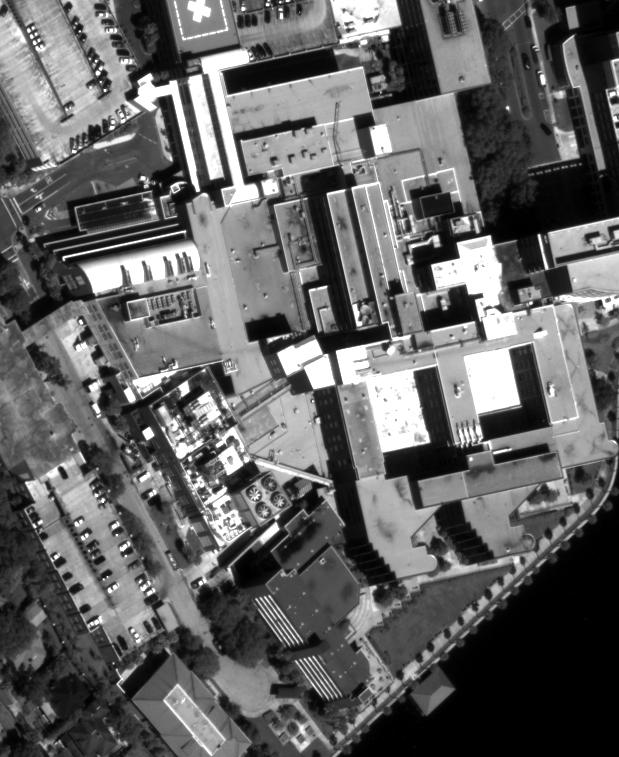
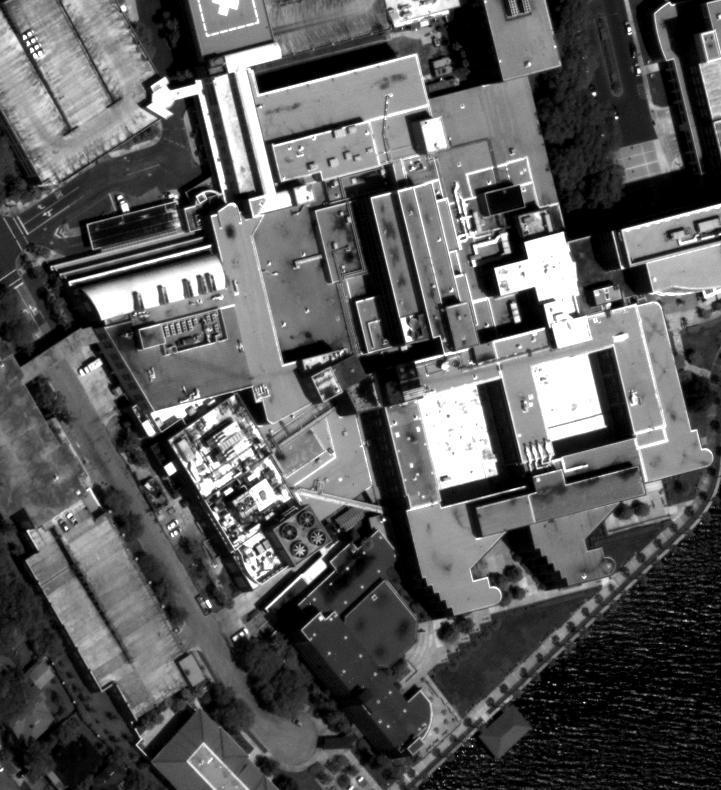
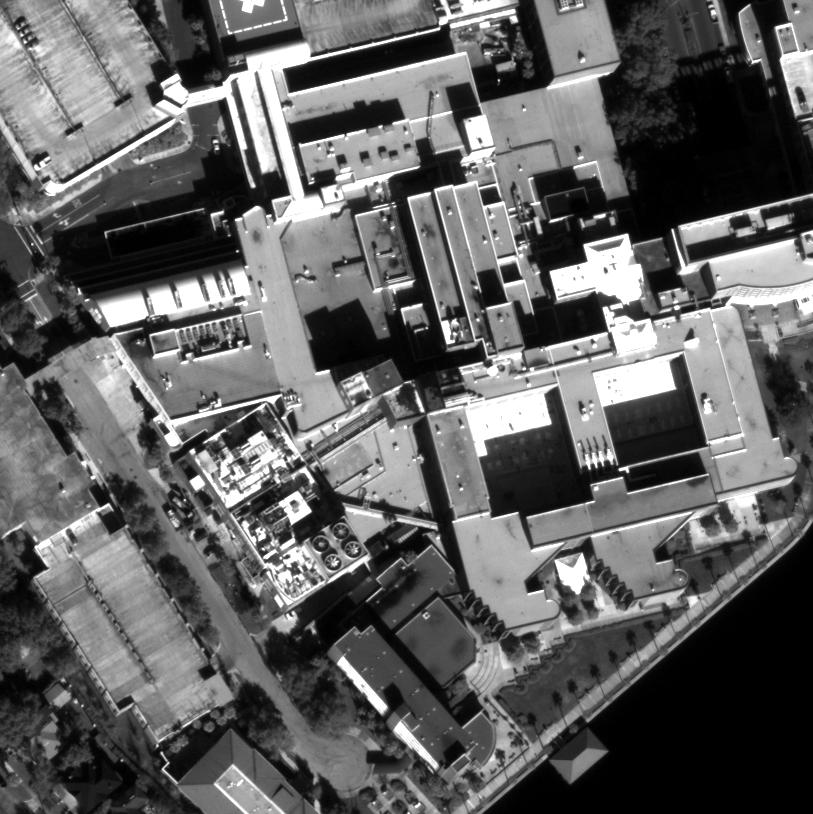
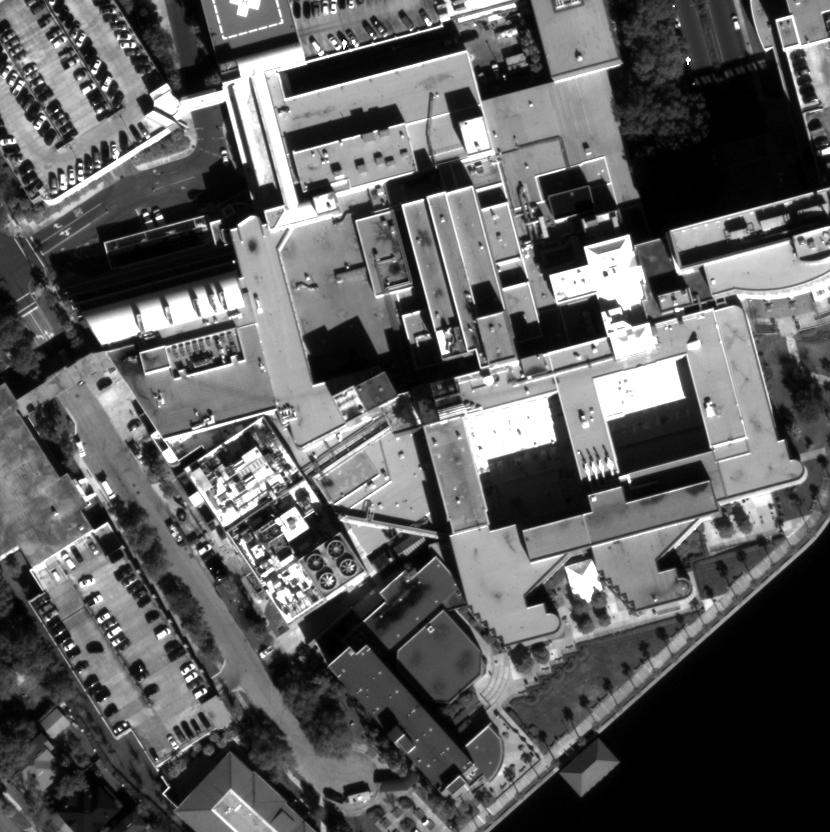
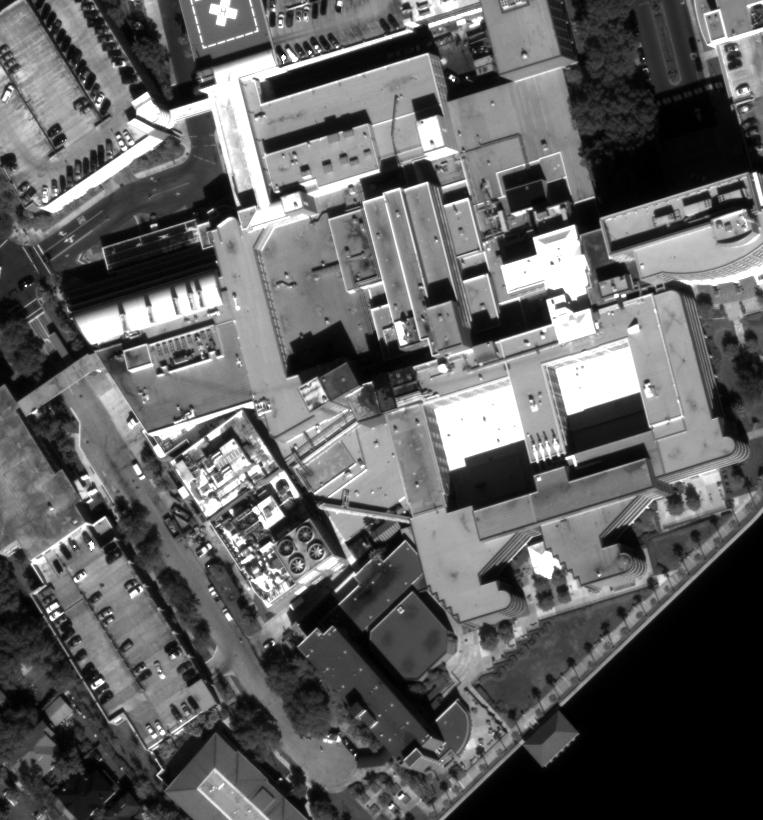

In [5]:
import bs4
import requests

def is_absolute(url):
    return bool(requests.utils.urlparse(url).netloc)

def find(url, extension):
    """
    Recursive directory listing, like "find . -name "*extension".

    Args:
        url (str):  directory url
        extension (str): file extension to match

    Returns:
        list of urls to files
    """
    r = requests.get(url)
    soup = bs4.BeautifulSoup(r.text, 'html.parser')
    files = [node.get('href') for node in soup.find_all('a') if node.get('href').endswith(extension)]
    folders = [node.get('href') for node in soup.find_all('a') if node.get('href').endswith('/')]

    files_urls = [f if is_absolute(f) else os.path.join(url, os.path.basename(f)) for f in files]
    folders_urls = [f if is_absolute(f) else os.path.join(url, os.path.basename(f.rstrip('/'))) for f in folders]

    for u in folders_urls:
        if not u.endswith(('../', '..')):
            files_urls += find(u, extension)
    return files_urls

rpcs_from_images = True

# load images from folder and rpcs from TXT
exp_name = 'iccv19/jax/jax251_ozcanli_heuristics'
input_dir = os.path.join('ba_experiments/',exp_name)

# list the tiff images available in the remote folder
#myimages = find('http://138.231.80.166:2332/core3d/Jacksonville/WV3/PAN/', '.NTF')
myimages = find('http://138.231.80.166:2332/core3d/Jacksonville/WV3/PAN/', '.NTF.tif')

# list the tiff images available in the remote folder
mygts = find('http://138.231.80.166:2332/grss-2019/track_3/Track3-Truth-geolocated/', '_DSM.tif')
mygt_fn = [i for i in mygts if 'JAX_251' in i]
aoi = utils.get_image_longlat_polygon(mygt_fn[0])
aoi['center'] = np.mean(aoi['coordinates'][0][:4], axis=0).tolist() # add center field

# select the number of cameras for the current run
n_cam = len(myimages)
print('Number of images to be used:', n_cam)

# load RPC coefficients
if not rpcs_from_images:
    #myrpcs = [rpc_model.RPCModel(os.path.splitext(im)[0]+'_rpc.txt') for im in myimages]
    myrpcs = [s2p.rpc_model.RPCModel(os.path.splitext(im)[0]+'_RPC.TXT') for im in myimages]
else:
    myrpcs = [s2p.rpc_utils.rpc_from_geotiff(x) for x in myimages]
print('Finished loading RPC coefficients')

# get the altitude of the center of the AOI
lon, lat = aoi['center']
z = srtm4.srtm4(lon, lat)

# crop the selected AOI in each image
mycrops, im = [], []
for iter_cont, f in enumerate(range(len(myimages))):
    crop, x0, y0 = utils.crop_aoi(myimages[f], aoi, z)
    mycrops.append({ 'crop': utils.simple_equalization_8bit(crop), 'x0': x0, 'y0': y0 })
    im.append(utils.simple_equalization_8bit(crop))
    print('\r{} / {} done'.format(iter_cont+1, len(myimages)), end = '\r')
print('Finished cropping the AOI in each image')
vistools.display_gallery(im)

### Save image crops

In [6]:
save_crops = True
if save_crops:
    crops_path = input_dir +'/crops'
    if not os.path.isdir(crops_path):
        os.mkdir(crops_path)
    import cv2
    for image, cont in zip(im, range(n_cam)):
        cv2.imwrite(crops_path+'/{:02}.png'.format(cont), image)
    print('Crops have been saved in the project folder')

Crops have been saved in the project folder


### Visualize map

In [7]:
# creates an interactive map and returns a map handle to interact with it.
mymap = vistools.clickablemap(zoom=12)
display(mymap)

# display the footprint polygons of the satellite images 
#for f in range(len(myimages)):
#    footprint = utils.get_image_longlat_polygon(myimages[f])

mymap.add_GeoJSON(aoi)


# add a polygon and center the map
mymap.center = aoi['center'][::-1]
mymap.zoom = 18

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

### Approximate RPCs as projection matrices

In [50]:
P_crop = []
if cam_model == 'Affine':
    p_geodetic = [aoi['center'][0], aoi['center'][1], 31.0] # lon, lat, alt
    p_x, p_y, p_z = ba_utils.latlon_to_ecef_custom(p_geodetic[1], p_geodetic[0], p_geodetic[2]) # in meters
    p_geocentric = [p_x, p_y, p_z]
    for rpc, crop, iter_cont in zip(myrpcs, mycrops, np.arange(len(mycrops))):
        # approximate current rpc as an affine 3x4 matrix
        P_img = rectification.rpc_affine_approximation2(rpc, p_geocentric)
        x, y, w, h = utils.bounding_box_of_projected_aoi(rpc, aoi, rpc.alt_offset)
        #express P in terms of crop coord by applying the translation x0, y0 (i.e. top-left corner of the crop)
        T_crop = np.array([[1., 0., -crop['x0']], [0., 1., -crop['y0']], [0., 0., 1.]])
        current_P = T_crop @ P_img
        P_crop.append(current_P/current_P[2,3])
        print('\rCamera {} / {} done'.format(iter_cont+1, len(mycrops)), end = '\r')
    print('\nRPCs successfully approximated as affine cameras')
else:
    myrpcs_s2p = [s2p.rpc_from_geotiff(x) for x in myimages]
    for rpc, rpc_s2p, crop, iter_cont in zip(myrpcs, myrpcs_s2p, mycrops, np.arange(len(mycrops))):
        # approximate current rpc as a perspective 3x4 matrix
        x, y, w, h = utils.bounding_box_of_projected_aoi(rpc, aoi, rpc.alt_offset)
        P_img = s2p.approximate_rpc_as_projective(rpc_s2p, [x,x+w,10], [y,y+h,10], \
                                              [rpc_s2p.altOff-100, rpc_s2p.altOff+100,10], verbose=False)
        #express P in terms of crop coord by applying the translation x0, y0 (i.e. top-left corner of the crop)
        T_crop = np.array([[1., 0., -crop['x0']], [0., 1., -crop['y0']], [0., 0., 1.]])
        current_P = T_crop @ P_img
        P_crop.append(current_P/current_P[2,3])
        print('\rCamera {} / {} done'.format(iter_cont+1, len(mycrops)), end = '\r')
    print('\nRPCs successfully approximated as perspective cameras')

Camera 47 / 47 done
RPCs successfully approximated as affine cameras


### Feature Track Detection 1.0

Improvements w.r.t version 0.0: hashing and intersection to build the tracks quickly as the new pairwise matches are found (sequential process).

In [70]:
if feature_tracks_1:

    # $ pip3 install opencv-python==3.4.0.12 opencv-contrib-python==3.4.0.12
    # otherwise sift might not work
    import cv2
    from multiprocessing import Pool

    #FEATURE TRACKS REPRESENTATION
    #feature_tracks': (track_id, (x,y), cam_id) --> (x, y) = coord of the 3D point of 'track_id' projected in 'cam_id'
    #r':              (track_id, cam_id) --> sparse matrix, r[track_id, cam_id] =1 if the 3D point is seen in 'cam_id'

    input_seq = [mycrops[f]['crop'] for f in range(len(mycrops))]   
    input_P = P_crop

    print('Running feature detection...\n')
    start = timeit.default_timer()
    last_stop = start

    # (1) detect SIFT keypoints in all images
    reduce_kp, max_kp_per_im = False, 7000
    n_img = len(input_seq)

    kp_cont = 0
    features = []
    for idx in range(n_img):
        kp, des = ba_utils.find_SIFT_kp(input_seq[idx])
        if kp.shape[0] > max_kp_per_im and reduce_kp:
            prev_idx = np.arange(kp.shape[0])
            new_idx = np.random.choice(prev_idx,max_kp_per_im,replace=False)
            new_kp, new_des = [kp[j] for j in new_idx], [des[j] for j in new_idx]
            kp, des = new_kp, new_des
        features.append({ 'kp': kp, 'des': des, 'id': np.arange(kp_cont, kp_cont + len(kp)).tolist() })
        print('Found', kp.shape[0], 'keypoints in image', idx)
        kp_cont += kp.shape[0]
        #im_kp=cv2.drawKeypoints(input_seq[idx],kp,outImage=np.array([]))
        #vistools.display_image(im_kp) 

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    print('\nComputing pairs to be matched...\n')

    #(2) pairs with extremly short baselines are not well posed for depth from stereo so we filter them
    pairs_to_match, matching_args = [], []
    for i in range(n_img):
        for j in range(i+1,n_img):
            _, _, _, optical_center1 = ba_utils.decompose_projection_matrix(input_P[i])
            _, _, _, optical_center2 = ba_utils.decompose_projection_matrix(input_P[j])

            baseline_thr = 150000 # esto deberian ser un poco más de la distancia recorrida en medio segundo (en m ?)
                                  # no me cuadra mucho con la supuesta speed de skysat de 7 km/s (~3500 m en medio s)

            if np.linalg.norm(optical_center2 - optical_center1) > baseline_thr :
                pairs_to_match.append([i,j])
                kp_i, des_i, kp_i_id = features[i]['kp'], features[i]['des'], np.array(features[i]['id'])
                kp_j, des_j, kp_j_id = features[j]['kp'], features[j]['des'], np.array(features[j]['id'])
                matching_args.append((kp_i, kp_j, des_i, des_j))

    print('{} / {} pairs to be matched'.format(len(pairs_to_match),int((n_img*(n_img-1))/2)))          

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    print('\nMatching...\n')

    # (3) create feature tracks
    tracks_id, feature_tracks, r = 0, np.zeros((1, 2, n_cam)), np.zeros((1, n_cam))
    for [i,j] in pairs_to_match:
        kp_i, des_i = features[i]['kp'], features[i]['des']
        kp_j, des_j = features[j]['kp'], features[j]['des']
        pts_i, pts_j, kp_i, kp_j, m_filt, m_all, _, _ = ba_utils.match_pair(kp_i, kp_j, des_i, des_j, 0.6)
        n_matches = 0 if pts_i is None else pts_i.shape[0]
        print('Pair ({},{}) -> {} matches preserved out of {}'.format(i,j,n_matches,len(m_all)))

        # display matches for pair (i,j)
        #im_matches = cv2.drawMatches(mycrops[i]['crop'],kp_i,mycrops[j]['crop'],kp_j,m_filt,outImg=np.array([]))
        #vistools.display_imshow(utils.simple_equalization_8bit(im_matches))

        if pts_i is not None:
            pts_i_tuples = [tuple(pair) for pair in pts_i.tolist()]
            pts_i_dict = {pair:i for i, pair in enumerate(pts_i_tuples)}

            pts_i_track = [tuple(pair) for pair in feature_tracks[:,:,i].tolist()]
            pts_i_track_dict = {pair:i for i, pair in enumerate(pts_i_track)}

            intersect = np.array([[pts_i_dict[k], pts_i_track_dict[k]] for k in pts_i_dict.keys()&pts_i_track_dict.keys()])
            # attention: the meaning/interst of 'intersect' is not trivial
            # each value in 'idx_pts_i' is the index of an observation X from 'pts_i', while each corresponding
            # value in 'idx_existing_tracks' is the index of the track that contains the observation X 
            if intersect.shape[0] > 0:
                idx_pts_i, idx_existing_tracks = intersect[:,0], intersect[:,1]
                # extend existing tracks by adding the coords of observation X in image j from pts_j
                feature_tracks[idx_existing_tracks,:,j] = pts_j[idx_pts_i,:]
                r[idx_existing_tracks,i], r[idx_existing_tracks,j] = 1, 1

            # list of points in 'pts_i' that do not correspond to any previous feature track
            new_pts_from_i = list(set(pts_i_dict) - set(pts_i_track_dict))
            if len(new_pts_from_i) > 0:
                new_pts_from_j = [tuple(pts_j[pts_i_dict[k],:]) for k in new_pts_from_i]
                new_tracks = np.zeros((len(new_pts_from_i),2,n_cam))
                new_tracks[:,:,i], new_tracks[:,:,j]  = np.array(new_pts_from_i), np.array(new_pts_from_j)
                new_r = np.zeros((len(new_pts_from_i),n_cam))
                new_r[:,i], new_r[:,j] = 1, 1
                feature_tracks, r = np.vstack((feature_tracks, new_tracks)), np.vstack((r, new_r))

    feature_tracks, r = feature_tracks[1:,:,:], r[1:,:]

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    print('\nBuilding correspondence matrix C...\n')

    C = np.around(ba_utils.corresp_matrix_from_tracks(feature_tracks, r), 6)

    stop = timeit.default_timer()
    print('\n\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    hours, rem = divmod(last_stop - start, 3600)
    minutes, seconds = divmod(rem, 60)
    print('\nTotal time: {:0>2}:{:0>2}:{:05.2f}'.format(int(hours),int(minutes),seconds))
    
    pickle_out = open(input_dir+'/features.pickle','wb')
    pickle.dump(C, pickle_out)
    pickle_out.close()
    print('\nCorrespondence matrix saved!')

### Feature Track Detection 2.0

Improvements w.r.t version 1.0: uses the union-find algorithm (i.e. the construction of feature tracks is not sequential anymore).

In [51]:
if feature_tracks_2:

    import timeit
    import cv2
    from multiprocessing import Pool

    input_seq = [mycrops[f]['crop'] for f in range(len(mycrops))]    
    input_P = P_crop

    print('Running feature detection...\n')
    start = timeit.default_timer()
    last_stop = start

    # (1) detect SIFT keypoints in all images
    n_img = len(input_seq)

    reduce_kp, max_kp_per_im = False, 7000
    kp_cont = 0
    features, all_keypoints, all_vertices = [], [], []
    for idx in range(n_img):
        kp, des = ba_utils.find_SIFT_kp(input_seq[idx])
        if kp.shape[0] > max_kp_per_im and reduce_kp:
            prev_idx = np.arange(kp.shape[0])
            new_idx = np.random.choice(prev_idx,max_kp_per_im,replace=False)
            new_kp, new_des = [kp[j] for j in new_idx], [des[j] for j in new_idx]
            kp, des = new_kp, new_des
        kp_id = np.arange(kp_cont, kp_cont + kp.shape[0]).tolist()
        features.append({ 'kp': kp, 'des': des, 'id': kp_id })
        all_keypoints.extend(kp.tolist())
        tmp = np.vstack((np.ones(kp.shape[0]).astype(int)*idx, kp_id)).T
        all_vertices.extend( tmp.tolist() )
        print('Found', kp.shape[0], 'keypoints in image', idx)
        kp_cont += len(kp)
        #im_kp=cv2.drawKeypoints(input_seq[idx],kp,outImage=np.array([]))
        #vistools.display_image(im_kp) 

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    print('\nComputing pairs to be matched...\n')

    #(2) pairs with extremly short baselines are not well posed for depth from stereo so we filter them
    pairs_to_match, matching_args = [], []
    for i in range(n_img):
        for j in range(i+1,n_img):
            '''
            _, _, _, optical_center1 = ba_utils.decompose_projection_matrix(input_P[i])
            _, _, _, optical_center2 = ba_utils.decompose_projection_matrix(input_P[j])

            baseline_thr = 150000 # esto deberian ser un poco más de la distancia recorrida en medio segundo (en m ?)
                                  # no me cuadra mucho con la supuesta speed de skysat de 7 km/s (~3500 m en medio s)
            '''
            pairs_to_match.append([i,j])

    print('{} / {} pairs to be matched'.format(len(pairs_to_match),int((n_img*(n_img-1))/2)))          

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    print('\nMatching...\n')

    # (3) match
    all_pairwise_matches = []
    for idx, [i,j] in enumerate(pairs_to_match):
        kp_i, des_i, kp_i_id = features[i]['kp'], features[i]['des'], np.array(features[i]['id'])
        kp_j, des_j, kp_j_id = features[j]['kp'], features[j]['des'], np.array(features[j]['id'])
        pts_i, pts_j, kp_i, kp_j, m_filt, m_all, indices_m_kp_i, indices_m_kp_j = ba_utils.match_pair(kp_i, kp_j, des_i, des_j)

        n_matches = 0 if indices_m_kp_i is None else len(indices_m_kp_i)
        print('Pair ({},{}) -> {} matches'.format(i,j,n_matches))

        # display matches for pair (i,j)
        #im_matches = cv2.drawMatches(mycrops[i]['crop'],kp_i,mycrops[j]['crop'],kp_j,m_filt,outImg=np.array([]))
        #vistools.display_imshow(utils.simple_equalization_8bit(im_matches))

        if pts_i is not None:
            matches_i_j = np.vstack((kp_i_id[indices_m_kp_i], kp_j_id[indices_m_kp_j])).T
            all_pairwise_matches.extend(matches_i_j.tolist())

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    print('\nRunning union-find...')

    def find(parents, feature_id):
        p = parents[feature_id]
        return feature_id if not p else find(parents, p)

    def union(parents, feature_i_idx, feature_j_idx):
        p_1, p_2 = find(parents, feature_i_idx), find(parents, feature_j_idx)
        if p_1 != p_2: 
            parents[p_1] = p_2

    parents = [None]*(len(all_vertices))
    for feature_i_idx, feature_j_idx in all_pairwise_matches:
        #fi, fj = vertex_i_idx, vertex_j_idx
        union(parents, feature_i_idx, feature_j_idx)

    # parents without None
    parents = [find(parents, feature_id) for feature_id, v in enumerate(parents)]

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    print('\nBuilding correspondence matrix C...\n')

    # parents = track_id
    _, parents_indices, parents_counts = np.unique(parents, return_inverse=True, return_counts=True)
    n_tracks = np.sum(1*(parents_counts>1))
    track_parents = np.array(parents)[parents_counts[parents_indices] > 1]
    _, track_idx_from_parent, _ = np.unique(track_parents, return_inverse=True, return_counts=True)

    # t_idx, parent_id
    track_indices = np.zeros(len(parents))
    track_indices[:] = np.nan
    track_indices[parents_counts[parents_indices] > 1] = track_idx_from_parent

    C = np.zeros((2*n_cam, n_tracks))
    C[:] = np.nan
    for (feature_i_id, feature_j_id) in all_pairwise_matches:
        t_idx, t_idx2 = int(track_indices[feature_i_id]), int(track_indices[feature_j_id])
        im_id_i, im_id_j = all_vertices[feature_i_id][0], all_vertices[feature_j_id][0]
        C[(2*im_id_i):(2*im_id_i+2), t_idx] = np.array(all_keypoints[feature_i_id])
        C[(2*im_id_j):(2*im_id_j+2), t_idx] = np.array(all_keypoints[feature_j_id])

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    hours, rem = divmod(last_stop - start, 3600)
    minutes, seconds = divmod(rem, 60)
    print('\nTotal time: {:0>2}:{:0>2}:{:05.2f}'.format(int(hours),int(minutes),seconds))
    
    pickle_out = open(input_dir+'/features.pickle','wb')
    pickle.dump(C, pickle_out)
    pickle_out.close()
    print('\nCorrespondence matrix saved!')

Running feature detection...

Found 2182 keypoints in image 0
Found 3544 keypoints in image 1
Found 3624 keypoints in image 2
Found 4173 keypoints in image 3
Found 1294 keypoints in image 4
Found 4112 keypoints in image 5
Found 1509 keypoints in image 6
Found 3852 keypoints in image 7
Found 2421 keypoints in image 8
Found 3537 keypoints in image 9
Found 2290 keypoints in image 10
Found 3358 keypoints in image 11
Found 3542 keypoints in image 12
Found 4185 keypoints in image 13
Found 3889 keypoints in image 14
Found 3749 keypoints in image 15
Found 3556 keypoints in image 16
Found 2219 keypoints in image 17
Found 3752 keypoints in image 18
Found 2901 keypoints in image 19
Found 3188 keypoints in image 20
Found 3245 keypoints in image 21
Found 2349 keypoints in image 22
Found 2991 keypoints in image 23
Found 2069 keypoints in image 24
Found 3561 keypoints in image 25
Found 3062 keypoints in image 26
Found 3755 keypoints in image 27
Found 1581 keypoints in image 28
Found 4432 keypoints in

KeyboardInterrupt: 

### Feature Track Detection 3.0

Uses union-find + parallelized s2p matching + intersection over image footprints to futher discard useless matching pairs.

In [72]:
if feature_tracks_3:

    from numpy.core.defchararray import add as add_str

    def create_kp_id(pt_coords, im_idx):
        pt = np.around(pt_coords[:,:2],4)
        pt_str = add_str(add_str('(',add_str(pt[:,0].astype('str'),',')),add_str(pt[:,1].astype('str'),')'))
        kp_id = add_str(pt_str,add_str('-',str(im_idx)))
        return kp_id

    import timeit
    from multiprocessing import Pool

    thresh_dog = 0.0133
    nb_octaves = 8
    nb_scales = 3
    offset = None

    n_img = len(mycrops)
    sift_args = [(mycrops[f]['crop'], thresh_dog, nb_octaves, nb_scales, offset) for f in range(n_img)]    

    print('Running feature detection...\n')
    start = timeit.default_timer()
    last_stop = start

    # (1) detect SIFT keypoints in all images

    with Pool() as p:
        features_output = p.starmap(s2p.sift.keypoints_from_nparray, sift_args)

    kp_cont = 0
    reduce_kp, max_kp_per_im = False, 7000
    features, kp_id_to_kp_idx, all_vertices, all_keypoints = [], {}, [], []
    for idx in range(n_img):
        kp = features_output[idx]
        if kp.shape[0] > max_kp_per_im and reduce_kp:
            prev_idx = np.arange(kp.shape[0])
            new_idx = np.random.choice(prev_idx,max_kp_per_im,replace=False)
            kp = kp[new_idx, :]
        all_keypoints.extend(kp[:,:2].tolist())
        kp_id = create_kp_id(kp[:,:2], idx)
        kp_idx = np.arange(kp_cont, kp_cont + kp.shape[0]).tolist()
        kp_id_to_kp_idx.update(dict(zip(kp_id, kp_idx)))
        tmp = np.vstack((np.ones(kp.shape[0]).astype(int)*idx, kp_idx)).T
        all_vertices.extend( tmp.tolist() )
        print('Found', kp.shape[0], 'keypoints in image', idx)
        kp_cont += len(kp)

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop


    import rpcm
    from shapely.geometry import Polygon, mapping, shape

    print('Computing pairs to be matched...\n')

    # set matching parameters
    method = 'relative'
    sift_thr = 0.6
    epipolar_thr = 10
    model = 'fundamental'
    ransac_max_err = 0.3

    
    #(2) pairs with extremly short baselines are not well posed for depth from stereo so we filter them
    pairs_to_match, matching_args = [], []
    for i in range(n_img):
        for j in range(i+1,n_img):

            '''
            # check there is enough overlap between the images (at least 10% w.r.t image 1)
            footprint_i, footprint_j = rpcm.image_footprint(myimages[i]), rpcm.image_footprint(myimages[j])
            polygon_i, polygon_j = shape(footprint_i), shape(footprint_j)
            intersection_polygon = polygon_i.intersection(polygon_j)        
            overlap_ok = intersection_polygon.area/polygon_i.area >= 0.05

            # check if the baseline between both cameras is large enough
            _, _, _, optical_center1 = ba_utils.decompose_projection_matrix(P_crop[i])
            _, _, _, optical_center2 = ba_utils.decompose_projection_matrix(P_crop[j])
            baseline_ok = np.linalg.norm(optical_center2 - optical_center1) > 150000
            '''
            overlap_ok = True
            baseline_ok = True

            if overlap_ok and baseline_ok:
                pairs_to_match.append([i,j])

                h, w = mycrops[i]['crop'].shape
                rpc_matches = s2p.rpc_utils.matches_from_rpc(myrpcs[i], myrpcs[j], 0, 0, w, h, 5)
                Fij = s2p.estimation.affine_fundamental_matrix(rpc_matches)

                matching_args.append((features_output[i], features_output[j], 
                                      method, sift_thr, Fij, epipolar_thr, model, ransac_max_err))

    print('{} / {} pairs to be matched'.format(len(pairs_to_match),int((n_img*(n_img-1))/2)))          

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    # (3) match

    print('\nMatching...\n')

    with Pool() as p:
        matching_output = p.starmap(s2p.sift.keypoints_match, matching_args)

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    all_pairwise_matches = []
    for pair_idx, [im_i_idx, im_j_idx] in enumerate(pairs_to_match):
        n_matches = matching_output[pair_idx].shape[0]
        print('Pair ({},{}) -> {} matches'.format(im_i_idx,im_j_idx,n_matches))
        if  n_matches > 0:
            pt_i, pt_j = matching_output[pair_idx][:,:2], matching_output[pair_idx][:,2:]
            kp_i_id, kp_j_id = create_kp_id(pt_i, im_i_idx), create_kp_id(pt_j, im_j_idx)

            kp_i_idx = [kp_id_to_kp_idx[k] for k in kp_i_id]
            kp_j_idx = [kp_id_to_kp_idx[k] for k in kp_j_id]

            matches_i_j = np.vstack((kp_i_idx, kp_j_idx)).T
            all_pairwise_matches.extend(matches_i_j.tolist())

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    print('\nRunning union-find...')

    def find(parents, feature_id):
        p = parents[feature_id]
        return feature_id if not p else find(parents, p)

    def union(parents, feature_i_idx, feature_j_idx):
        p_1, p_2 = find(parents, feature_i_idx), find(parents, feature_j_idx)
        if p_1 != p_2: 
            parents[p_1] = p_2

    parents = [None]*(len(all_vertices))
    for feature_i_idx, feature_j_idx in all_pairwise_matches:
        #fi, fj = vertex_i_idx, vertex_j_idx
        union(parents, feature_i_idx, feature_j_idx)

    # set properly parents that are none
    parents = [find(parents, feature_id) for feature_id, v in enumerate(parents)]

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    print('\nBuilding correspondence matrix C...\n')

    # parents = track_id
    _, parents_indices, parents_counts = np.unique(parents, return_inverse=True, return_counts=True)
    n_tracks = np.sum(1*(parents_counts>1))
    track_parents = np.array(parents)[parents_counts[parents_indices] > 1]
    _, track_idx_from_parent, _ = np.unique(track_parents, return_inverse=True, return_counts=True)

    # t_idx, parent_id
    track_indices = np.zeros(len(parents))
    track_indices[:] = np.nan
    track_indices[parents_counts[parents_indices] > 1] = track_idx_from_parent

    C = np.zeros((2*n_cam, n_tracks))
    C[:] = np.nan
    keypoints_ids = [*kp_id_to_kp_idx]
    for (feature_i_id, feature_j_id) in all_pairwise_matches:
        t_idx, t_idx2 = int(track_indices[feature_i_id]), int(track_indices[feature_j_id])
        im_id_i, im_id_j = all_vertices[feature_i_id][0], all_vertices[feature_j_id][0]
        C[(2*im_id_i):(2*im_id_i+2), t_idx] = np.array(all_keypoints[feature_i_id])
        C[(2*im_id_j):(2*im_id_j+2), t_idx] = np.array(all_keypoints[feature_j_id])

    stop = timeit.default_timer()
    print('\n...done in {} seconds'.format(stop - last_stop))
    last_stop = stop

    hours, rem = divmod(last_stop - start, 3600)
    minutes, seconds = divmod(rem, 60)
    print('\nTotal time: {:0>2}:{:0>2}:{:05.2f}'.format(int(hours),int(minutes),seconds))
    
    pickle_out = open(input_dir+'/features.pickle','wb')
    pickle.dump(C, pickle_out)
    pickle_out.close()
    print('\nCorrespondence matrix saved!')

### Visualize a feature track before Bundle Adjustment

Initializing 3D points...
...done!

 ----> Real 2D loc in im 22  (sol) =  [159.32316589 150.87698364]
 ----> Proj 2D loc in im 22  before BA =  [159.0201818  150.91118891]
              Reprojection error beofre BA: 0.33718936145305634
 ----> Real 2D loc in im 24  (sol) =  [164.02342224 151.34634399]
 ----> Proj 2D loc in im 24  before BA =  [164.62315767 151.27196465]
              Reprojection error beofre BA: 0.6741147767752409
 ----> Real 2D loc in im 28  (sol) =  [152.90010071 148.80223083]
 ----> Proj 2D loc in im 28  before BA =  [153.75694639 151.12262898]
              Reprojection error beofre BA: 3.177243834361434


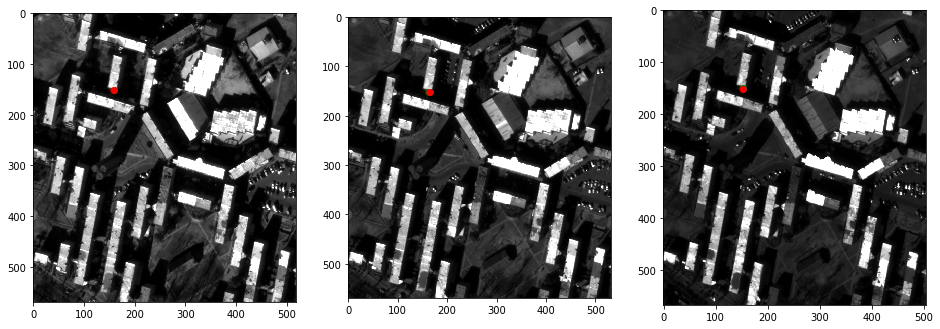

In [171]:
print('Initializing 3D points...')

pts_3d, C = ba_utils.initialize_3d_points(P_crop, C, cam_model, var_filt=False, var_hist=True)

print('...done!\n')

p_ind = np.random.choice(np.arange(0,C.shape[1]))
im_ind = [k for k, j in enumerate(range(n_cam)) if not np.isnan(C[j*2,p_ind])]
reprojection_error, reprojection_error_ba  = 0., 0.
cont = -1
_,f = plt.subplots(1, len(im_ind), figsize=(16,12))
                                           
for i in im_ind:   
    cont += 1
    
    p_2d_gt = C[(i*2):(i*2+2),p_ind]
    
    #proj = P_crop_ba[i] @ np.expand_dims(np.hstack((pts_3d_ba[p_ind,:], np.ones(1))), axis=1)
    #p_2d_proj_ba = proj[0:2,:] / proj[-1,-1]
    proj = P_crop[i] @ np.expand_dims(np.hstack((pts_3d[p_ind,:], np.ones(1))), axis=1)
    p_2d_proj = proj[0:2,:] / proj[-1,-1]
    
    #if cont == 0:
        #print('3D location (initial)  :', pts_3d[p_ind,:].ravel())
        #print('3D location (after BA) :', pts_3d_ba[p_ind,:].ravel(), '\n')
    
    print(' ----> Real 2D loc in im', i, ' (sol) = ', p_2d_gt)
    print(' ----> Proj 2D loc in im', i, ' before BA = ', p_2d_proj.ravel())
    #print(' ----> Proj 2D loc in im', i, ' after  BA = ', p_2d_proj_ba.ravel())
    print('              Reprojection error beofre BA:', np.sum(abs(p_2d_proj.ravel() - p_2d_gt)))
    #print('              Reprojection error after  BA:', np.sum(abs(p_2d_proj_ba.ravel() - p_2d_gt)))
    
    f[cont].imshow(mycrops[i]['crop'], cmap="gray")
    f[cont].plot(*p_2d_gt, "go")
    f[cont].plot(*p_2d_proj, "ro")
    #f[cont].plot(*p_2d_gt[::-1], "yo")
    #f[cont].plot(*p_2d_proj[::-1], "ro")    
    #f[cont].plot(*p_2d_proj_ba, "go")

Load feature tracks:

In [74]:
pickle_in = open(input_dir+'/features.pickle','rb')
C = pickle.load(pickle_in)
print('Correspondence matrix loaded!')

Correspondence matrix loaded!


Remove incomplete tracks if wanted:

In [75]:
# invert coords of the tracks (necessary when dealing with the preliminary camera model of skysat)
#C2 = np.zeros(C.shape)
#C2[::2,:] = C[1::2,:]
#C2[1::2,:] = C[::2, :]
#C = C2.copy()

# select a random subset of 1000 obs
#idx_to_preserve = np.random.choice(np.arange(C.shape[1]), (1000,), replace=False)
#C = C[:,idx_to_preserve]

#C = C[:, ~(np.sum((C!=C).astype(int), 0)).astype(bool)]

#print('Only complete feature tracks were preserved: {} in total'. format(C.shape[1]))

### Initialize 3D points for Bundle Adjustment

In [7]:
print('Initializing 3D points...')

pts_3d, C = ba_utils.initialize_3d_points(P_crop, C, cam_model, var_filt=False, var_hist=True)

print('...done!\n')

print(pts_3d)

Initializing 3D points...
...done!

[[ 2743064.40843732 -4491237.23471002 -3591398.57265038]
 [ 2743042.10658196 -4491197.20248761 -3591445.40775212]
 [ 2743057.70289619 -4491201.82971051 -3591434.58924372]
 ...
 [ 2743233.5907442  -4491170.09138907 -3591393.34563004]
 [ 2743227.57743782 -4491213.03611065 -3591455.46124076]
 [ 2743206.96461419 -4491120.7244663  -3591469.39436049]]


### Define Bundle Adjustment parameters

In [8]:
'''
INPUT PARAMETERS FOR BUNDLE ADJUSTMENT
'cam_params': (n_cam, 12), initial projection matrices. 1 row = 1 camera estimate.
              first 3 elements of each row = R vector, next 3 = T vector, then f and two dist. coef.
'pts_3d'    : (n_pts, 3) contains the initial estimates of the 3D points in the world frame.
'cam_ind'   : (n_observations,), indices of cameras (from 0 to n_cam - 1) involved in each observation.
'pts_ind'   : (n_observations,) indices of points (from 0 to n_points - 1) involved in each observation.
'pts_2d'    : (n_observations, 2) 2-D coordinates of points projected on images in each observations.
'''

print('Defining BA input parameters...')

pts_3d_opt = pts_3d.copy()
cam_params, cam_params_opt, properR_axis, pts_2d, cam_ind, pts_ind, ba_params \
= ba_utils.set_ba_params(P_crop, C, cam_model, R_params='Euler', opt_X=True, opt_R=True, opt_T=False, opt_K=False)

print('...done!\n')

print('pts_2d.shape:{}  pts_ind.shape:{}  cam_ind.shape:{}'.format(pts_2d.shape, pts_ind.shape, cam_ind.shape))
print('pts_3d.shape:{}  cam_params.shape:{} cam_params_opt.shape:{}\n'.format(pts_3d.shape, cam_params.shape, cam_params_opt.shape))
print('Bundle Adjustment parameters defined')

if ba_params['n_params'] > 0 and ba_params['opt_X']:
    print('  -> Both camera parameters and 3D points will be optimized')
elif ba_params['n_params'] > 0 and not ba_params['opt_X']:
    print('  -> Only the camera parameters will be optimized')
else:
    print('  -> Only 3D points will be optimized')

Defining BA input parameters...
...done!

pts_2d.shape:(30704, 2)  pts_ind.shape:(30704,)  cam_ind.shape:(30704,)
pts_3d.shape:(10060, 3)  cam_params.shape:(47, 8) cam_params_opt.shape:(47, 3)

Bundle Adjustment parameters defined
  -> Both camera parameters and 3D points will be optimized


### Run Bundle Adjustment (soft L1 loss)

Shape of matrix A: 61408x30321
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.2825e+05                                    9.03e+09    
       1             12         1.2707e+05      1.19e+03       3.74e+02       9.05e+09    
       2             13         1.2507e+05      2.00e+03       1.26e+02       9.05e+09    
       3             14         1.2457e+05      4.96e+02       2.18e+02       9.05e+09    
       4             15         1.2432e+05      2.58e+02       1.21e+01       9.05e+09    
       5             16         1.2384e+05      4.78e+02       2.26e+01       9.05e+09    
       6             17         1.2305e+05      7.90e+02       3.52e+01       9.05e+09    
       7             18         1.2196e+05      1.09e+03       4.63e+01       9.04e+09    
       8             19         1.2076e+05      1.19e+03       6.68e+01       9.02e+09    
       9             21         1.2071e+05      5.44e+01   

      89             102        7.7276e+04      1.86e+02       5.89e+01       6.05e+07    
      90             103        7.7150e+04      1.26e+02       5.92e+01       5.88e+07    
      91             104        7.6958e+04      1.91e+02       5.89e+01       5.77e+07    
      92             105        7.6818e+04      1.41e+02       6.81e+01       5.68e+07    
      93             106        7.6660e+04      1.58e+02       6.23e+01       5.56e+07    
      94             107        7.6575e+04      8.49e+01       5.82e+01       5.40e+07    
      95             108        7.6487e+04      8.77e+01       1.35e+01       5.39e+07    
      96             109        7.6374e+04      1.13e+02       2.74e+01       5.31e+07    
      97             110        7.6344e+04      3.03e+01       2.52e+01       5.29e+07    
      98             111        7.6302e+04      4.17e+01       6.35e+00       5.26e+07    
      99             112        7.6246e+04      5.58e+01       1.05e+01       5.19e+07    

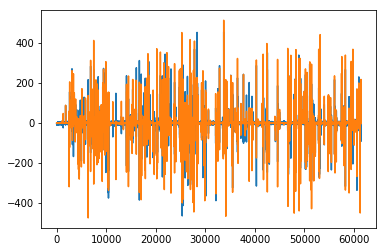

In [9]:
import time
from scipy.optimize import least_squares, minimize

pts_2d_w = np.ones(pts_2d.shape[0])

# compute loss value and plot residuals at the initial parameters
if ba_params['opt_K'] and ba_params['fix_K']:
    params_in_K = 3 if cam_model == 'Affine' else 5
    K = cam_params_opt[0,-params_in_K:]
    cam_params_opt2 = np.hstack([cam_params_opt[cam_id, :-params_in_K] for cam_id in range(n_cam)])
    cam_params_opt2 = np.hstack((K, cam_params_opt2))
    x0 = np.hstack((cam_params_opt2.ravel(), pts_3d_opt.ravel()))
else:
    x0 = np.hstack((cam_params_opt.ravel(), pts_3d_opt.ravel()))
f0 = ba_utils.fun(x0, cam_ind, pts_ind, pts_2d, properR_axis, cam_params, pts_3d, ba_params, pts_2d_w)
plt.plot(f0)

# define jacobian
A = ba_utils.bundle_adjustment_sparsity(cam_ind, pts_ind, ba_params)

# run bundle adjustment
t0 = time.time()
res = least_squares(ba_utils.fun, x0, jac_sparsity=A, verbose=2, x_scale='jac',
                    method='trf', ftol=1e-4, xtol=1e-10, loss='soft_l1', f_scale = 0.5,
                    args=(cam_ind, pts_ind, pts_2d, properR_axis, cam_params, pts_3d, ba_params, pts_2d_w))

t1 = time.time()
print("Optimization took {0:.0f} seconds".format(t1 - t0))

#plot residuals at the found solution
plt.plot(res.fun);

# recover BA output
pts_3d_ba, cam_params_ba, P_crop_ba = ba_utils.get_ba_output(res.x, ba_params, properR_axis, cam_params, pts_3d)

### Check reprojection error before and after Bundle Adjustment

Error before BA (mean / median): 8.92 / 2.31
Error after  BA (mean / median): 4.88 / 0.26


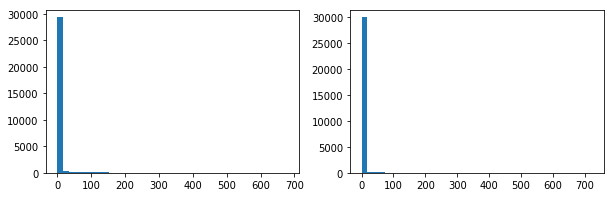

In [12]:
# check BA error performance

des_norm = np.repeat(pts_2d_w,2, axis=0)

init_e = np.add.reduceat(abs(f0.astype(float)/des_norm), np.arange(0, len(f0), 2))
very_intial_error = init_e
init_e_mean = np.mean(init_e)
init_e_median = np.median(init_e)

ba_e = np.add.reduceat(abs(res.fun.astype(float)/des_norm), np.arange(0, len(res.fun), 2))
ba_e_mean = np.mean(ba_e)
ba_e_median = np.median(ba_e)

print('Error before BA (mean / median): {:.2f} / {:.2f}'.format(init_e_mean, init_e_median))
print('Error after  BA (mean / median): {:.2f} / {:.2f}'.format(ba_e_mean, ba_e_median))

_,f = plt.subplots(1, 2, figsize=(10,3))
f[0].hist(init_e, bins=40);
f[1].hist(ba_e, bins=40); 

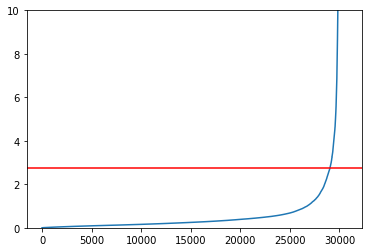

In [16]:
def get_elbow_value(init_e):

    sort_indices = np.argsort(init_e)
    
    values = np.sort(init_e).tolist()
    nPoints = len(values)
    allCoord = np.vstack((range(nPoints), values)).T

    # get the first point
    firstPoint = allCoord[0]
    # get vector between first and last point - this is the line
    lineVec = allCoord[-1] - allCoord[0]
    lineVecNorm = lineVec / np.sqrt(np.sum(lineVec**2))

    # find the distance from each point to the line:
    # vector between all points and first point
    vecFromFirst = allCoord - firstPoint

    scalarProduct = np.sum(vecFromFirst * np.tile(lineVecNorm, (nPoints, 1)), axis=1)
    vecFromFirstParallel = np.outer(scalarProduct, lineVecNorm)
    vecToLine = vecFromFirst - vecFromFirstParallel

    # distance to line is the norm of vecToLine
    distToLine = np.sqrt(np.sum(vecToLine ** 2, axis=1))

    # knee/elbow is the point with max distance value
    elbow_value2 = values[np.argmax(distToLine)]

    elbow_value = np.percentile(init_e[init_e < elbow_value2], 95) + 1
    
    return elbow_value

error = ba_e
plt.plot(np.sort(error))
plt.axhline(y=get_elbow_value(error), color='r', linestyle='-')
plt.ylim([0, 10])
plt.show()

1.751050061290151

In [17]:
error = ba_e
print('Elbow value is {}'.format(get_elbow_value(error)))
newC = ba_utils.remove_outlier_obs(error, pts_ind, cam_ind, C, outlier_thr=get_elbow_value(error))

print('Initializing 3D points...')

pts_3d, newC = ba_utils.initialize_3d_points(P_crop, newC, cam_model, var_filt=False, var_hist=True)

print('...done!\n')

print('Defining BA input parameters...')

pts_3d_opt = pts_3d.copy()
cam_params, cam_params_opt, properR_axis, pts_2d, cam_ind, pts_ind, ba_params \
= ba_utils.set_ba_params(P_crop, newC, cam_model, R_params='Euler', opt_X=True, opt_R=True, opt_T=False, opt_K=False)

print('...done!\n')

Elbow value is 2.751050061290151
Deleted 1658 observations (5.40%) and 347 tracks (3.45%)

Initializing 3D points...
...done!

Defining BA input parameters...
...done!



In [204]:
pickle_out = open(input_dir+'/features_after_outlier_removal.pickle','wb')
pickle.dump(newC, pickle_out)
pickle_out.close()
print('\nCorrespondence matrix saved!')


Correspondence matrix saved!


Shape of matrix A: 57722x29280
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.6609e+05                                    8.05e+10    
       1              2         2.4100e+03      1.64e+05       1.06e+03       1.18e+05    
       2              3         2.4100e+03      2.32e-03       9.35e-01       5.54e+04    
       3              4         2.4100e+03      2.87e-04       2.15e-01       2.29e+04    
       4              5         2.4100e+03      8.38e-05       8.22e-02       5.06e+04    
       5              6         2.4100e+03      3.13e-05       2.36e-02       1.52e+04    
`xtol` termination condition is satisfied.
Function evaluations 6, initial cost 1.6609e+05, final cost 2.4100e+03, first-order optimality 1.52e+04.
Optimization took 3 seconds


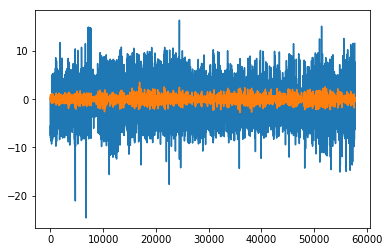

In [18]:
import time
from scipy.optimize import least_squares, minimize

pts_2d_w = np.ones(pts_2d.shape[0])

# compute loss value and plot residuals at the initial parameters
if ba_params['opt_K'] and ba_params['fix_K']:
    params_in_K = 3 if cam_model == 'Affine' else 5
    K = cam_params_opt[0,-params_in_K:]
    cam_params_opt2 = np.hstack([cam_params_opt[cam_id, :-params_in_K] for cam_id in range(n_cam)])
    cam_params_opt2 = np.hstack((K, cam_params_opt2))
    x0 = np.hstack((cam_params_opt2.ravel(), pts_3d_opt.ravel()))
else:
    x0 = np.hstack((cam_params_opt.ravel(), pts_3d_opt.ravel()))
f0 = ba_utils.fun(x0, cam_ind, pts_ind, pts_2d, properR_axis, cam_params, pts_3d, ba_params, pts_2d_w)
plt.plot(f0)

# define jacobian
A = ba_utils.bundle_adjustment_sparsity(cam_ind, pts_ind, ba_params)

# run bundle adjustment
t0 = time.time()
res = least_squares(ba_utils.fun, x0, jac_sparsity=A, verbose=2, x_scale='jac',
                    method='trf', ftol=1e-8, xtol=1e-10, #loss='soft_l1', f_scale = 0.5,
                    args=(cam_ind, pts_ind, pts_2d, properR_axis, cam_params, pts_3d, ba_params, pts_2d_w))

t1 = time.time()
print("Optimization took {0:.0f} seconds".format(t1 - t0))

#plot residuals at the found solution
plt.plot(res.fun);

# recover BA output
pts_3d_ba, cam_params_ba, P_crop_ba = ba_utils.get_ba_output(res.x, ba_params, properR_axis, cam_params, pts_3d)

Error before BA (mean / median): 2.97 / 2.06
Error after  BA (mean / median): 0.34 / 0.22


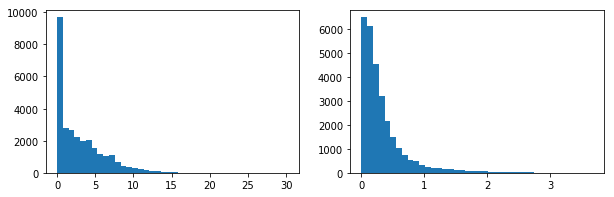

In [19]:
# check BA error performance

des_norm = np.repeat(pts_2d_w,2, axis=0)

init_e = np.add.reduceat(abs(f0.astype(float)/des_norm), np.arange(0, len(f0), 2))
init_e_mean = np.mean(init_e)
init_e_median = np.median(init_e)

ba_e = np.add.reduceat(abs(res.fun.astype(float)/des_norm), np.arange(0, len(res.fun), 2))
ba_e_mean = np.mean(ba_e)
ba_e_median = np.median(ba_e)

print('Error before BA (mean / median): {:.2f} / {:.2f}'.format(init_e_mean, init_e_median))
print('Error after  BA (mean / median): {:.2f} / {:.2f}'.format(ba_e_mean, ba_e_median))

_,f = plt.subplots(1, 2, figsize=(10,3))
f[0].hist(init_e, bins=40);
f[1].hist(ba_e, bins=40); 

### Visualize a feature track before and after Bundle Adjustment

Verify that the projections after Bundle Adjustment are closer to the observations of the feature track.

 ----> Real 2D loc in im 6  (sol) =  [ 69.19892883 306.41488647]
 ----> Proj 2D loc in im 6  before BA =  [ 70.66177879 305.75932068]
 ----> Proj 2D loc in im 6  after  BA =  [ 69.21917052 305.13477309]
              Reprojection error beofre BA: 2.118415754288435
              Reprojection error after  BA: 1.3003550712019205
 ----> Real 2D loc in im 10  (sol) =  [ 70.32614899 302.05523682]
 ----> Proj 2D loc in im 10  before BA =  [ 66.50032695 301.89400074]
 ----> Proj 2D loc in im 10  after  BA =  [ 69.96827148 302.59358533]
              Reprojection error beofre BA: 3.9870581179857254
              Reprojection error after  BA: 0.8962260261178017
 ----> Real 2D loc in im 28  (sol) =  [ 60.8583107 294.3883667]
 ----> Proj 2D loc in im 28  before BA =  [ 67.3355959 294.35888  ]
 ----> Proj 2D loc in im 28  after  BA =  [ 61.18580978 295.16535001]
              Reprojection error beofre BA: 6.506771901622415
              Reprojection error after  BA: 1.1044823918491602

ECEF coordin

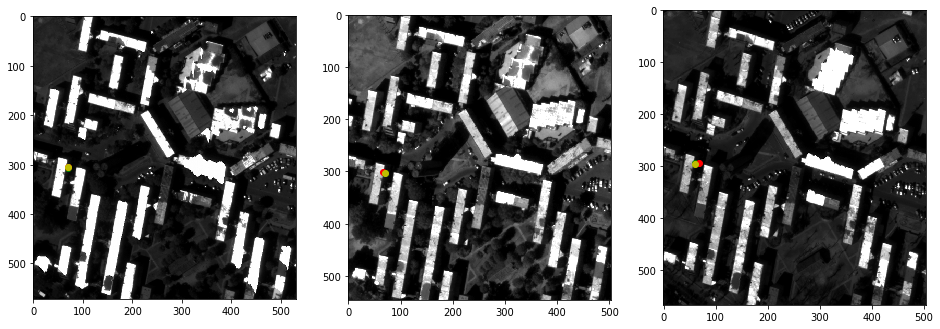

In [20]:
n_pts = newC.shape[1]
#p_ind = pts_ind[np.argmax(init_e)]
#p_ind = pts_ind[np.argmax(ba_e)] # idx of observation with max error
p_ind = np.random.choice(np.arange(0,n_pts))
im_ind = [k for k, j in enumerate(range(n_cam)) if not np.isnan(newC[j*2,p_ind])]
reprojection_error, reprojection_error_ba  = 0., 0.
cont = -1
_,f = plt.subplots(1, len(im_ind), figsize=(16,12))
                                           
for i in im_ind:   
    cont += 1
    
    p_2d_gt = newC[(i*2):(i*2+2),p_ind]
    
    proj = P_crop_ba[i] @ np.expand_dims(np.hstack((pts_3d_ba[p_ind,:], np.ones(1))), axis=1)
    p_2d_proj_ba = proj[0:2,:] / proj[-1,-1]
    proj = P_crop[i] @ np.expand_dims(np.hstack((pts_3d[p_ind,:], np.ones(1))), axis=1)
    p_2d_proj = proj[0:2,:] / proj[-1,-1]
    
    #if cont == 0:
        #print('3D location (initial)  :', pts_3d[p_ind,:].ravel())
        #print('3D location (after BA) :', pts_3d_ba[p_ind,:].ravel(), '\n')
    
    print(' ----> Real 2D loc in im', i, ' (sol) = ', p_2d_gt)
    print(' ----> Proj 2D loc in im', i, ' before BA = ', p_2d_proj.ravel())
    print(' ----> Proj 2D loc in im', i, ' after  BA = ', p_2d_proj_ba.ravel())
    print('              Reprojection error beofre BA:', np.sum(abs(p_2d_proj.ravel() - p_2d_gt)))
    print('              Reprojection error after  BA:', np.sum(abs(p_2d_proj_ba.ravel() - p_2d_gt)))
    
    f[cont].imshow(mycrops[i]['crop'], cmap="gray")
    f[cont].plot(*p_2d_gt, "go")
    f[cont].plot(*p_2d_proj, "ro")
    f[cont].plot(*p_2d_proj_ba, "yo")
    #f[cont].plot(*p_2d_gt[::-1], "yo")
    #f[cont].plot(*p_2d_proj[::-1], "ro")    
    #f[cont].plot(*p_2d_proj_ba, "go")
    
print('\nECEF coordinates of the 3D point:', pts_3d_ba[p_ind])

lat, lon, h = ba_utils.ecef_to_latlon_custom(x=pts_3d_ba[p_ind,0], y=pts_3d_ba[p_ind,1], z=pts_3d_ba[p_ind,2])
print('lat, lon: [{:.3f}, {:.3f}], alt: {:.3f}'.format(lat, lon, h))

### Do the 3D points fall in the correct place?

Verify that the projection of the bounding box containing the point cloud of the scene falls in the correct area of the Earth.

In [87]:
lat, lon, alt = ba_utils.ecef_to_latlon_custom(pts_3d_ba[:,0], pts_3d_ba[:,1], pts_3d_ba[:,2])

mymap = vistools.clickablemap(zoom=12)
## set the coordinates of the area of interest as a GeoJSON polygon
aoi_sanity_check = {'coordinates': [[[min(lon), min(lat)], [min(lon), max(lat)], 
                                     [max(lon), max(lat)], [max(lon), min(lat)],
                                     [min(lon), min(lat)]]], 'type': 'Polygon'}
# set the center of the aoi
aoi_sanity_check['center'] = np.mean(aoi_sanity_check['coordinates'][0][:4], axis=0).tolist()
# display a polygon covering the aoi and center the map
mymap.add_GeoJSON(aoi_sanity_check) 
mymap.center = aoi_sanity_check['center'][::-1]
mymap.zoom = 15         
display(mymap)

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

### Detailed view of initial-final reprojection errors for a particular image

This can be used to analyse a particular image in detail.

image 0, mean abs reproj error before BA: 271.1982
image 0, mean abs reproj error after  BA: 270.4095


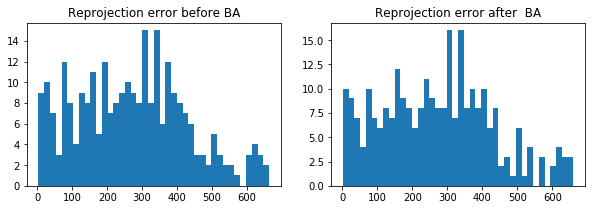

In [42]:
# set the index of the image to analyse
im_idx = 0

# pick all points visible in the selected image

pts_gt = newC[(im_idx*2):(im_idx*2+2),~np.isnan(newC[im_idx*2,:])].T

#pts_gt = np.flip(pts_gt, 1)

pts_3d_before = pts_3d[~np.isnan(newC[im_idx*2,:]),:]
pts_3d_after = pts_3d_ba[~np.isnan(newC[im_idx*2,:]),:]

# reprojections before bundle adjustment
proj = P_crop[im_idx] @ np.hstack((pts_3d_before, np.ones((pts_3d_before.shape[0],1)))).T
pts_reproj_before = (proj[:2,:]/proj[-1,:]).T
#pts_reproj_before = pts_reproj_before[::-1]

# reprojections after bundle adjustment
proj = P_crop_ba[im_idx] @ np.hstack((pts_3d_after, np.ones((pts_3d_after.shape[0],1)))).T
pts_reproj_after = (proj[:2,:]/proj[-1,:]).T

err_before = np.sum(abs(pts_reproj_before - pts_gt), axis=1)
err_after = np.sum(abs(pts_reproj_after - pts_gt), axis=1)

print('image {}, mean abs reproj error before BA: {:.4f}'.format(im_idx, np.mean(err_before)))
print('image {}, mean abs reproj error after  BA: {:.4f}'.format(im_idx, np.mean(err_after)))

# reprojection error histograms for the selected image
fig = plt.figure(figsize=(10,3))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.title.set_text('Reprojection error before BA')
ax2.title.set_text('Reprojection error after  BA')
ax1.hist(err_before, bins=40); 
ax2.hist(err_after, bins=40);

plt.show()

Simple visualization. Green crosses represent the detected feature tracks, and red vectors are the distance to the reprojected point locations. 

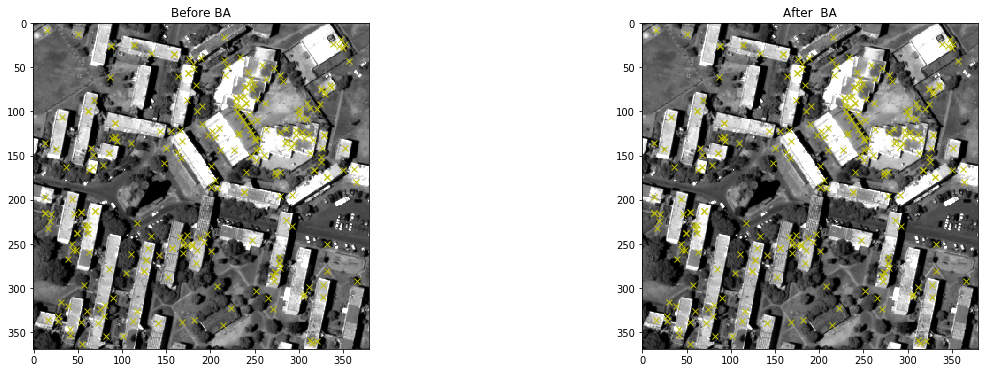

In [46]:
# warning: this is slow...

pts_gt = np.flip(pts_gt, 1)

fig = plt.figure(figsize=(20,6))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.title.set_text('Before BA')
ax2.title.set_text('After  BA')
ax1.imshow((mycrops[im_idx]['crop']), cmap="gray")
ax2.imshow((mycrops[im_idx]['crop']), cmap="gray")
for k in range(min(1000,pts_gt.shape[0])):
    # before bundle adjustment
    ax1.plot([pts_gt[k,1], pts_reproj_before[k,1] ], [pts_gt[k,0], pts_reproj_before[k,0] ], 'r-', lw=3)
    ax1.plot(*pts_gt[k], 'yx')
    # after bundle adjustment
    #ax2.plot([pts_gt[k,0], pts_reproj_after[k,0] ], [pts_gt[k,1], pts_reproj_after[k,1]], 'r-', lw=3)
    ax2.plot(*pts_gt[k], 'yx')
plt.show()


### Check the distance between the projection rays of two cameras

This gives an idea of the error in the traingulation of points before and after Bundle Adjustment.

In [90]:
from PIL import Image

if check_triangulation_err:

    print('Checking the distance between projection rays...')

    im1, im2 = 0,1

    # get SIFT keypoints visible in both images
    visible_idx = np.logical_and(~np.isnan(newC[im1*2,:]), ~np.isnan(newC[im2*2,:])) 
    pts1, pts2 = newC[(im1*2):(im1*2+2), visible_idx], newC[(im2*2):(im2*2+2), visible_idx]
    tr_err, tr_err_ba = [],[]
    pts_3d_sift, pts_3d_sift_ba = np.zeros((pts1.shape[1], 3)), np.zeros((pts1.shape[1], 3))

    triangulate_err_hist = True 
    triangulate_err_dsm  = False

    # triangulate and compute triangulation error (i.e. distance between projection rays)
    for n in range(pts1.shape[1]):
        pt1, pt2 = pts1[:,n].ravel(), pts2[:,n].ravel()
        # before bundle adjustment
        pts_3d_sift[n,:] = ba_utils.linear_triangulation_single_pt(pt1, pt2, P_crop[im1], P_crop[im2])
        tr_err.append(ba_utils.dist_between_proj_rays(pt1, pt2, P_crop[im1], P_crop[im2]))
        # after bundle adjustment
        pts_3d_sift_ba[n,:] = ba_utils.linear_triangulation_single_pt(pt1, pt2, P_crop_ba[im1], P_crop_ba[im2])
        tr_err_ba.append(ba_utils.dist_between_proj_rays(pt1, pt2, P_crop_ba[im1], P_crop_ba[im2]))

    if triangulate_err_hist:
        fig = plt.figure(figsize=(10,3))
        ax1 = fig.add_subplot(121)
        ax2 = fig.add_subplot(122)
        ax1.title.set_text('Triangulation error before BA')
        ax2.title.set_text('Triangulation error after  BA')
        ax1.hist(tr_err, bins=40); 
        ax2.hist(tr_err_ba, bins=40);

    # project dsm of the cloud but instead of projecting the height, project the triangulation error
    if triangulate_err_dsm:
        # before bundle adjustment
        x , y, z = pts_3d_sift[:,0], pts_3d_sift[:,1], pts_3d_sift[:,2]
        lat, lon, h = ba_utils.ecef_to_latlon_custom(x, y, z)
        east, north = utils.utm_from_lonlat(lon, lat)
        xyz = np.vstack((east, north, tr_err)).T
        _, dem_nan, _ = triangulation.project_cloud_into_utm_grid(xyz, emin, emax, nmin, nmax, resolution=10.0)
        im = Image.fromarray(dem_nan)
        im.save(input_dir+'/triangulate_{}_{}.tif'.format(im1,im2))
        # after bundle adjustment
        x , y, z = pts_3d_sift_ba[:,0], pts_3d_sift_ba[:,1], pts_3d_sift_ba[:,2]
        lat, lon, h = ba_utils.ecef_to_latlon_custom(x, y, z)
        east, north = utils.utm_from_lonlat(lon, lat)
        xyz = np.vstack((east, north, tr_err_ba)).T
        _, dem_nan, _ = triangulation.project_cloud_into_utm_grid(xyz, emin, emax, nmin, nmax, resolution=10.0)
        im = Image.fromarray(dem_nan)
        im.save(input_dir+'/triangulate_{}_{}_ba.tif'.format(im1,im2))

    print('...done!\n')

### Save point clouds of SIFT keypoints before and after Bundle Adjustment 

In [91]:
if sift_point_clouds:

    print('Writing point clouds of SIFT keypoints...')

    if not os.path.isdir(input_dir+'/sift_clouds_before'):
        os.mkdir(input_dir+'/sift_clouds_before')
    if not os.path.isdir(input_dir+'/sift_clouds_after'):
        os.mkdir(input_dir+'/sift_clouds_after')

    # pairs with extremly short baselines are not well posed for depth from stereo so we filter them
    pairs_to_match = []
    for i in range(n_cam):
        for j in range(i+1,n_cam):
            _, _, _, optical_center1 = ba_utils.decompose_projection_matrix(P_crop[i])
            _, _, _, optical_center2 = ba_utils.decompose_projection_matrix(P_crop[j])
            if np.linalg.norm(optical_center2 - optical_center1) > 150000 :
                pairs_to_match.append([i,j])  


    for [im1,im2] in pairs_to_match:

        # get SIFT keypoints visible in both images
        visible_idx = np.logical_and(~np.isnan(newC[im1*2,:]), ~np.isnan(newC[im2*2,:])) 
        pts1, pts2 = newC[(im1*2):(im1*2+2), visible_idx], newC[(im2*2):(im2*2+2), visible_idx]

        # triangulation of SIFT keypoints before bundle adjustment
        pts_3d_sift = ba_utils.triangulate_list_of_matches(pts1, pts2, P_crop[im1], P_crop[im2])
        x , y, z = pts_3d_sift[:,0], pts_3d_sift[:,1], pts_3d_sift[:,2]
        lat, lon, h = ba_utils.ecef_to_latlon_custom(x, y, z)
        east, north = utils.utm_from_lonlat(lon, lat)
        xyz = np.vstack((east, north, h)).T
        fn = input_dir+'/sift_clouds_before/{:02}_{:02}.ply'.format(im1, im2)
        ba_utils.write_point_cloud_ply(fn, xyz, color=np.random.choice(range(256), size=3))

        # triangulation of SIFT keypoints after bundle adjustment
        pts_3d_sift = ba_utils.triangulate_list_of_matches(pts1, pts2, P_crop_ba[im1], P_crop_ba[im2])
        x , y, z = pts_3d_sift[:,0], pts_3d_sift[:,1], pts_3d_sift[:,2]
        lat, lon, h = ba_utils.ecef_to_latlon_custom(x, y, z)
        east, north = utils.utm_from_lonlat(lon, lat)
        xyz = np.vstack((east, north, h)).T
        fn = input_dir+'/sift_clouds_after/{:02}_{:02}_ba.ply'.format(im1, im2)
        ba_utils.write_point_cloud_ply(fn, xyz, color=np.random.choice(range(256), size=3))

    print('...done!\n')

### Recover the corrected RPCs from the corrected projection matrices

In [92]:
#fit rpc

if save_adj_rpcs:

    import rpc_fit
    import copy

    if not os.path.isdir(input_dir+'/rpc_adj'):
        os.mkdir(input_dir+'/rpc_adj')

    # rpc fitting starts here
    myrpcs_calib = []
    verbose = True
    for im_idx in range(n_cam):

        rpc_init = copy.copy(myrpcs[im_idx])

        # calibrate and get error
        input_P, input_im, input_ecef = P_crop_ba[im_idx], mycrops[im_idx]['crop'], pts_3d_ba
        rpc_calib, err_calib = rpc_fit.fit_rpc_from_projection_matrix(rpc_init, input_P, input_im, input_ecef)
        print('image {}, RMSE calibrated RPC = {}'.format(im_idx, err_calib))

        rpc_calib_fn = os.path.basename(os.path.splitext(myimages[im_idx])[0])+'_rpc_adj.txt'
        rpc_calib.write_to_file(input_dir+'/rpc_adj/'+rpc_calib_fn)

        myrpcs_calib.append(rpc_calib)

        # check the histogram of errors if the RMSE error is above subpixel
        if err_calib > 1.0 and verbose:
            col_pred, row_pred = rpc_calib.projection(lon, lat, alt)
            err = np.sum(abs(np.hstack([col_pred.reshape(-1, 1), row_pred.reshape(-1, 1)]) - target), axis=1)
            plt.figure()
            plt.hist(err, bins=30);
            plt.show()

Verify that the reprojection of 3d points with the RPC is closer than 0.0001 to the reprojection given by the corrected projection matrix.

In [93]:
# check that the calibrated RPCs are OK

if save_adj_rpcs:

    for im_idx in range(int(newC.shape[0]/2)):
        for p_idx in range(newC.shape[1]):
            if not np.isnan(newC[2*im_idx,p_idx]):
                p_2d_gt = newC[(im_idx*2):(im_idx*2+2),p_idx]
                current_p = pts_3d_ba[p_idx,:]
                lat, lon, alt = ba_utils.ecef_to_latlon_custom(current_p[0], current_p[1], current_p[2])
                proj = P_crop[im_idx] @ np.expand_dims(np.hstack((current_p, np.ones(1))), axis=1)
                p_2d_proj = (proj[0:2,:] / proj[-1,-1]).ravel()
                col, row = myrpcs[im_idx].projection(lon, lat, alt)
                p_2d_proj_rpc = np.hstack([col - mycrops[im_idx]['x0'], row - mycrops[im_idx]['y0']]).ravel()
                proj = P_crop_ba[im_idx] @ np.expand_dims(np.hstack((current_p, np.ones(1))), axis=1)
                p_2d_proj_ba = (proj[0:2,:] / proj[-1,-1]).ravel()
                col, row = myrpcs_calib[im_idx].projection(lon, lat, alt)
                p_2d_proj_rpc_ba = np.hstack([col, row])

                reprojection_error_P = np.sum(abs(p_2d_proj_ba - p_2d_gt))
                reprojection_error_RPC = np.sum(abs(p_2d_proj_rpc_ba - p_2d_gt))

                if abs(reprojection_error_RPC - reprojection_error_P) > 0.001:
                    print('cam {}, point {}'.format(im_idx, p_idx))
                    print('GT            : {:.4f} , {:.4f}'.format(p_2d_gt[0], p_2d_gt[1]))
                    print('RPC proj      : {:.4f} , {:.4f}'.format(p_2d_proj_rpc[0], p_2d_proj_rpc[1]))
                    print('P proj        : {:.4f} , {:.4f}'.format(p_2d_proj[0], p_2d_proj[1]))
                    print('P proj   (BA) : {:.4f} , {:.4f}'.format(p_2d_proj_ba[0], p_2d_proj_ba[1]))
                    print('RPC proj (BA) : {:.4f} , {:.4f}'.format(p_2d_proj_rpc_ba[0], p_2d_proj_rpc_ba[1]))

        print('Finished checking image {}'.format(im_idx))

In [226]:
exp_name = 'iccv19/iarpa/iarpa_ba'
input_dir = os.path.join('ba_experiments/',exp_name)

### Compute point clouds for all pairs

In [ ]:
if ALL_PIPELINE:
    
    from multiprocessing import Pool
    
    # get a dense point cloud for all possible pairs
    #list_of_pairs = ba_utils.get_predefined_pairs(input_dir+'/order_heuristics.txt')
    #list_of_pairs = ba_utils.get_predefined_pairs2(input_dir+'/scene_IARPA.txt', myimages)
    #list_of_pairs = ba_utils.get_predefined_pairs('ba_experiments/pairs/order_using_sift.txt')
    list_of_pairs = ba_utils.get_predefined_pairs(input_dir+'/oracle_order.txt')
    #list_of_pairs = ba_utils.get_predefined_pairs(input_dir+'/order_using_heuristic_new.txt')

    if not os.path.isdir(input_dir+'/clouds'):
        os.mkdir(input_dir+'/clouds')

    def create_cloud(pair):
        i, j = pair
        cloud =  ba_utils.cloud_from_pair(i, j, P_crop_ba[i], P_crop_ba[j], cam_model, myimages, mycrops, aoi)
        x , y, z = cloud[:,0], cloud[:,1], cloud[:,2]
        lat, lon, h = ba_utils.ecef_to_latlon_custom(x, y, z)
        east, north = utils.utm_from_lonlat(lon, lat)
        xyz = np.vstack((east, north, h)).T
        ba_utils.write_point_cloud_ply(input_dir+'/clouds/dense_cloud_{:02}_{:02}.ply'.format(i,j), xyz)
        
    #with Pool(10) as p:
    #    matching_output = p.map(create_cloud, list_of_pairs)
    
    print('\nComputing point clouds from stereo pairs...')
    for iter_cont, pair in enumerate(list_of_pairs):
        create_cloud(pair)
        print('{} / {} done'.format(iter_cont+1, len(list_of_pairs)))
    print('\nDone!\n')


Computing point clouds from stereo pairs...
t=2.2823 done building CV
t=5.8364 done sgmfilter
t=6.0437 done aggregation and WTA refinement
t=2.3520 done building CV
t=6.0718 done sgmfilter
t=6.2867 done aggregation and WTA refinement
1 / 50 done
t=2.2542 done building CV
t=5.6484 done sgmfilter
t=5.8422 done aggregation and WTA refinement
t=2.1345 done building CV
t=5.8996 done sgmfilter
t=6.1025 done aggregation and WTA refinement
2 / 50 done
t=2.3048 done building CV
t=5.8574 done sgmfilter
t=6.0680 done aggregation and WTA refinement
t=2.4001 done building CV
t=5.8212 done sgmfilter
t=6.0259 done aggregation and WTA refinement
3 / 50 done
t=2.5080 done building CV
t=6.2474 done sgmfilter
t=6.4475 done aggregation and WTA refinement
t=2.1773 done building CV
t=5.6665 done sgmfilter
t=5.8765 done aggregation and WTA refinement
4 / 50 done
t=2.0965 done building CV
t=6.1814 done sgmfilter
t=6.3813 done aggregation and WTA refinement
t=1.9974 done building CV
t=5.3006 done sgmfilter
t=

In [ ]:
myimages

### Postprocess output DSMs

In [ ]:
if ALL_PIPELINE:
    
    from PIL import Image
    import re
    import subprocess

    if not os.path.isdir(input_dir+'/dsm'):
        os.mkdir(input_dir+'/dsm')
    if not os.path.isdir(input_dir+'/cdsm'):
        os.mkdir(input_dir+'/cdsm')
    if not os.path.isdir(input_dir+'/mcdsm'):
        os.mkdir(input_dir+'/mcdsm')
    if not os.path.isdir(input_dir+'/rcdsm'):
        os.mkdir(input_dir+'/rcdsm')
    if not os.path.isdir(input_dir+'/output'):
        os.mkdir(input_dir+'/output')
    if not os.path.isdir(input_dir+'/ncc_transform'):
        os.mkdir(input_dir+'/ncc_transform')

    # use the aoi to set the limits of the grid where the point clouds will be projected to DSMs
    emin, emax, nmin, nmax = utils.utm_bounding_box_from_lonlat_aoi(aoi)
    px_size = 0.300000011920929 # to set the DSMs resolution

    # project all point colouds to DSMs
    print('Creating DSMs...')
    ply_files = [filenames for (dirpath, dirnames, filenames) in os.walk(input_dir+'/clouds')][0]
    for iter_cont, filename in enumerate(ply_files):
        xyz = ba_utils.read_point_cloud_ply(input_dir+'/clouds/'+filename)
        dem, dem_nan, dem_std = triangulation.project_cloud_into_utm_grid(xyz, emin, emax, nmin, nmax, resolution=px_size)
        im = Image.fromarray(dem_nan)
        im.save(input_dir+'/dsm/dsm_{}.tif'.format(os.path.splitext(filename[12:])[0]))
        print('\r{} / {} done'.format(iter_cont+1, len(ply_files)), end = '\r')
    print('\nDone!\n')

    # post-process DSMs
    print('Post-processing DSMs...')
    dsm_files = [filenames for (dirpath, dirnames, filenames) in os.walk(input_dir+'/dsm')][0]
    for iter_cont, filename in enumerate(dsm_files):
        dsm = input_dir+'/dsm/'+filename # original dsm

        # small hole interpolation by closing
        cdsm = input_dir+'/cdsm/c'+filename  # dsm after closing
        os.system('bin/morsi square closing {0} | bin/plambda {0} - "x isfinite x y isfinite y nan if if" -o {1}'.format(dsm, cdsm))

        # larger holes with min interpolation
        mcdsm = input_dir+'/mcdsm/mc'+filename  # dsm after closing and min interpolation
        os.system('bin/bdint5pc -a min {} {}'.format(cdsm, mcdsm))
        print('\r{} / {} done'.format(iter_cont+1, len(dsm_files)), end = '\r')
    print('\nDone!\n')

    a, b = list_of_pairs[0] # take first pair as reference
    ref_dsm = input_dir+'/dsm/dsm_{:02}_{:02}.tif'.format(a,b)
    ref_cdsm = input_dir+'/cdsm/cdsm_{:02}_{:02}.tif'.format(a,b)
    ref_mcdsm = input_dir+'/mcdsm/mcdsm_{:02}_{:02}.tif'.format(a,b)
    print('Selected pair {:02}_{:02} as the reference one'.format(a,b))

    # align DSMs using 3D translations maximizing the NCC of their geometry
    print('Aligning DSMs...')
    for iter_cont, filename in enumerate(dsm_files):
        cdsm = input_dir+'/cdsm/c'+filename
        mcdsm = input_dir+'/mcdsm/mc'+filename
        rcdsm = input_dir+'/rcdsm/rc'+filename
        trans = input_dir+'/ncc_transform/t_'+os.path.splitext(filename)[0]+'.txt'  

        #use this to avoid computing the ncc transform and trust 100% the BA alignment
        with open(trans, 'w') as f_out:
            f_out.write('0 0 1.000000 0.000000')

        # apply the registration
        os.system('bin/ncc_apply_shift {} `cat {}` {}'.format(cdsm, trans, rcdsm))
        print('\r{} / {} done'.format(iter_cont+1, len(dsm_files)), end = '\r')
    print('\nDone!\n')

Creating DSMs...


### Fuse output DSMs

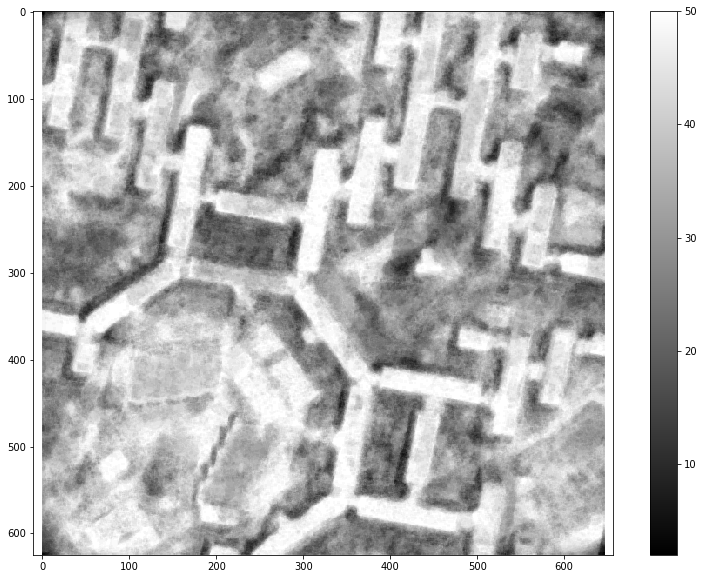

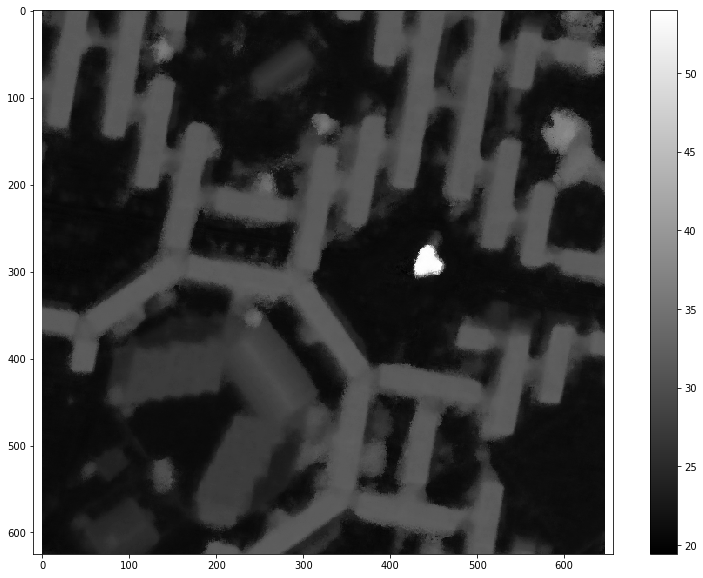

In [222]:
if ALL_PIPELINE:

    from PIL import Image
    import re
    import subprocess

    # stack the N output DSMs in a WxHxN grid
    rcdsm_files = [filenames for (dirpath, dirnames, filenames) in os.walk(input_dir+'/rcdsm')][0]
    olist = [input_dir+'/rcdsm/'+filename for filename in rcdsm_files]
    u=[]
    for ofile in olist:
        u.append(np.array(Image.open(ofile)))
    stacked_rcdsm = np.dstack(u)

    # pointwise median to fuse all DSMs
    fusion_result = np.nanmedian(stacked_rcdsm, axis=2)

    # visualize the number of samples per pixel
    nan_idx = np.isnan(stacked_rcdsm)
    obs_per_px = np.sum((~nan_idx).astype(int), axis=2).astype(float)

    vistools.display_imshow(obs_per_px)
    vistools.display_imshow(fusion_result)
    im = Image.fromarray(fusion_result)
    im.save(input_dir+'/output/fused_dsm.tif')

### Prepare GT DSM

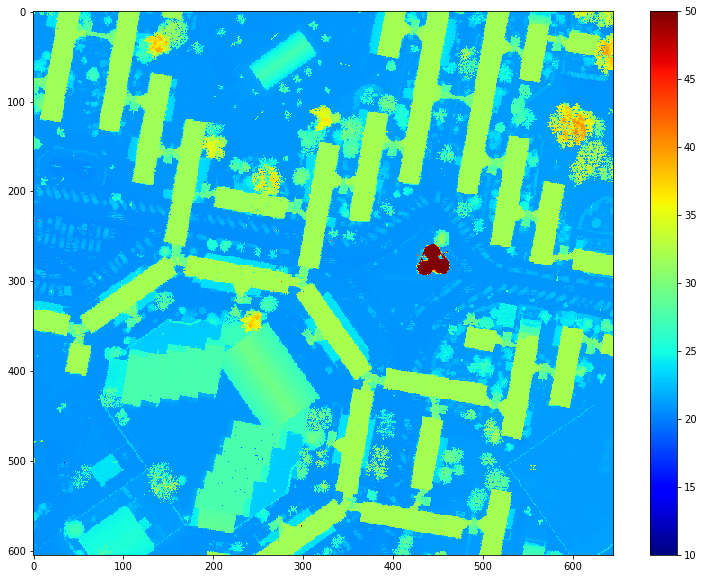

In [223]:
# prepare GT dem to obtain performance score

if ALL_PIPELINE:

    from PIL import Image

    emin, emax, nmin, nmax = utils.utm_bounding_box_from_lonlat_aoi(aoi)

    # read the ground truth geotiff  
    gt_dsm = np.array(Image.open(input_dir+'/gt_dsm.tif'))
    lon, lat = np.array([-58.585185]), np.array([-34.48922])
    east, north = utils.utm_from_lonlat(lon, lat)

    # write the necessary data from gdalinfo (northing (y) needs to be expressed in negative coordinates)
    epsg, x, y, px_size = 32721, 354449.320, 6182457.920 - 10000000, 0.300000011920929

    # attention: the top-left corner from the gt tiff and the one from the aoi are not exactly coincident

    # save the gt geotiff but this time with northing in negative coordinates
    ba_utils.save_geotiff(input_dir+'/gt_dsm2.tif', gt_dsm.astype(np.float64), epsg, x, y, r=px_size)

    # elevate the geotiff we just wrote and write the point cloud in a ply file
    os.system('bin/elevate '+input_dir+'/gt_dsm2.tif > '+input_dir+'/gt_cloud.txt')
    xyz = ba_utils.read_point_cloud_txt(input_dir+'/gt_cloud.txt')
    ba_utils.write_point_cloud_ply(input_dir+'/gt_cloud.ply', xyz)

    # project the recently created point cloud into the aoi and create a dem
    xyz = ba_utils.read_point_cloud_ply(input_dir+'/gt_cloud.ply')
    dem_3,dem_nan,dem_std = triangulation.project_cloud_into_utm_grid(xyz, emin, emax, nmin, nmax, resolution=px_size)

    # save the dem as the new ready-to-be-used gt
    im = Image.fromarray(dem_nan)
    im.save(input_dir+'/gt_dsm_nan.tif')

    # filter those values where we do not have gt available
    rows_with_gt = ~np.all(np.isnan(dem_nan), axis=1)
    cols_with_gt = ~np.all(np.isnan(dem_nan), axis=0)
    dem_3 = dem_3[rows_with_gt, :]
    dem_3 = dem_3[:, cols_with_gt]
    im = Image.fromarray(dem_3)
    im.save(input_dir+'/gt_dsm3.tif')

    vistools.display_imshow(dem_3, cmap='jet', range=(10,50))

### Prepare Solution DSM

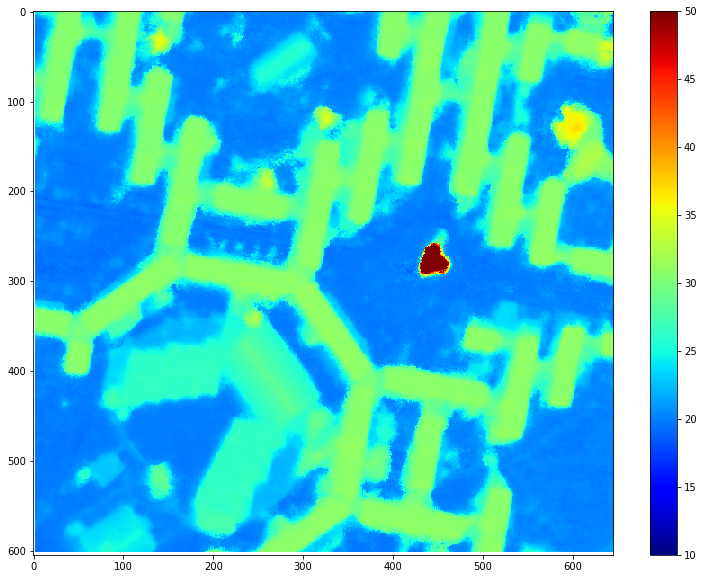

In [224]:
if ALL_PIPELINE:
    
    # prepare SOL dem to obtain performance score

    # read fused and gt dem
    out_dsm = np.array(Image.open(input_dir+'/output/fused_dsm.tif'))
    gt_dsm  = np.array(Image.open(input_dir+'/gt_dsm_nan.tif'))

    # filter those values where we do not have gt available
    rows_with_gt = ~np.all(np.isnan(gt_dsm), axis=1)
    cols_with_gt = ~np.all(np.isnan(gt_dsm), axis=0)
    out_dsm2 = out_dsm[rows_with_gt, :]
    out_dsm2 = out_dsm2[:, cols_with_gt]
    im = Image.fromarray(out_dsm2)
    im.save(input_dir+'/output/fused_dsm2.tif')

    out_dsm = input_dir+'/output/fused_dsm2.tif'
    gt_dsm  = input_dir+'/gt_dsm3.tif'

    # compute horizontal registration on the interpolated DSMs
    trans = input_dir+'/t_sol.txt'
    os.system('bin/ncc_compute_shift {} {} 5 > {}'.format(gt_dsm, out_dsm, trans))
    dx, dy = np.loadtxt(trans)[:2]

    # compute vertical registration on the original DSMs
    os.system('bin/ncc_compute_shift {} {} 5 {} {} > {}'.format(gt_dsm, out_dsm, dx, dy, trans))

    # apply the registration
    os.system('bin/ncc_apply_shift {} `cat {}` {}'.format(out_dsm, trans, input_dir+'/sol_dsm.tif'))

    # copy geotiff properties from the gt dsm to the sol dsm
    #os.system('python gdalcopyproj.py {} {}'.format(gt_dsm, input_dir+'/sol_dsm.tif'))

    sol_dsm = np.array(Image.open(input_dir+'/sol_dsm.tif'))
    vistools.display_imshow(sol_dsm, cmap='jet', range=(10,50))

In [216]:
input_dir

'ba_experiments/iccv19/iarpa/iarpa_ba_heuristics'

In [224]:
input_dir='ba_experiments/iccv19/iarpa/iarpa_ba_heuristics'

### Compute score

score: 70.04231945764954
nan: 0.9656372335798125
mean_e: 1.5423695
median_e: 0.7154541
std_e: 2.2771926


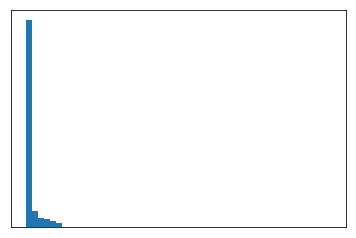

In [226]:
if ALL_PIPELINE:
    
    # compute score
    from PIL import Image

    #input_dir = 'ba_experiments/50pairs_iarpa'

    dem_gt = np.array(Image.open(input_dir+'/gt_dsm3.tif'))
    dem_sol = np.array(Image.open(input_dir+'/sol_dsm.tif'))

    # compute mse and completness (i.e. % of px with error lower than 1 m)
    # first remove possible nans from the solution
    idx = ~np.isnan(dem_sol)
    dem_gt2, dem_sol2 = dem_gt[idx], dem_sol[idx]
    total_px = dem_gt2.shape[0]
    nan_values = 100 - ((dem_gt2.shape[0]/ (dem_gt.shape[0] * dem_gt.shape[1]) ) * 100)
    mean_e = np.mean((abs(dem_gt2 - dem_sol2)))
    median_e = np.median(abs(dem_gt2 - dem_sol2))
    std_e = np.std(abs(dem_gt2 - dem_sol2))
    #total_px = dem_gt.shape[0] * dem_gt.shape[1]
    completness = sum( (abs(dem_gt2 - dem_sol2) < 1.0).astype(int) ) / total_px * 100

    plt.hist(abs(dem_gt2 - dem_sol2), bins=50) 

    print('score:', completness)
    print('nan:', nan_values)
    print('mean_e:', mean_e)
    print('median_e:', median_e)
    print('std_e:', std_e)

### Get sift order

In [119]:
n_cam = int(newC.shape[0]/2)
n_correspondences_filt, tmp_pairs = [], []
for im1 in range(n_cam):
    for im2 in range(im1+1,n_cam):
        obs_im1 = 1*np.invert(np.isnan(newC[2*im1,:]))
        obs_im2 = 1*np.invert(np.isnan(newC[2*im2,:]))
        n_matches = np.sum(np.sum(np.vstack((obs_im1, obs_im2)), axis=0) == 2)
        n_correspondences_filt.append(n_matches)
        tmp_pairs.append((im1,im2))
        
n_correspondences_filt = np.array(n_correspondences_filt)

sorted_indices = np.flip(np.argsort(n_correspondences_filt))

F = open(input_dir+'/sift_order.txt','w')
for index in sorted_indices:
    F.write('{} {}\n'.format(tmp_pairs[index][0]+1, tmp_pairs[index][1]+1))
F.close()

### Count overlapping pairs

In [ ]:
list_of_pairs_oracle = ba_utils.get_predefined_pairs(input_dir+'/jax161.txt')
#list_of_pairs_heuristics = ba_utils.get_predefined_pairs(input_dir+'/order_using_heuristic_new.txt')
#list_of_pairs_heuristics = ba_utils.get_predefined_pairs(input_dir+'/sift_order.txt')
list_of_pairs_heuristics = ba_utils.get_predefined_pairs2_jax(input_dir+'/scene_JAX.txt', myimages)

cont = 0
for pair in list_of_pairs_heuristics:
    if pair in list_of_pairs_oracle:
        cont += 1
    else:
        if (pair[1], pair[0]) in list_of_pairs_oracle:
            cont += 1
print('{} / 50'.format(cont))   

### Save PGF output model vs ground-truth

<Figure size 432x288 with 0 Axes>

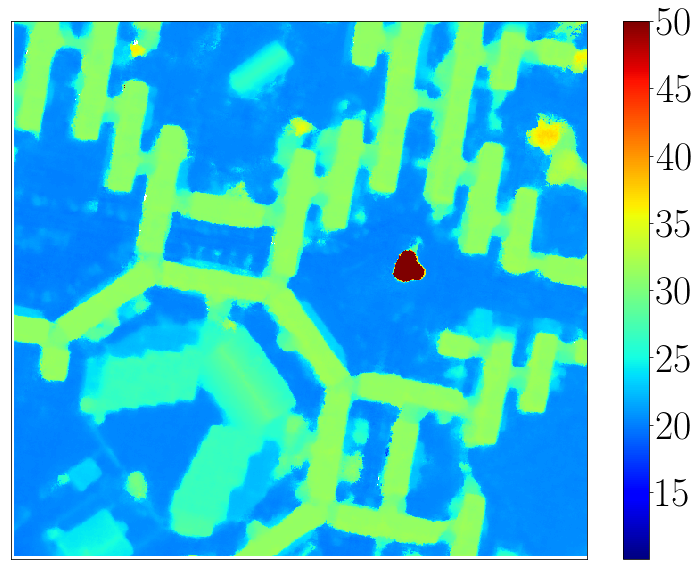

<Figure size 432x288 with 0 Axes>

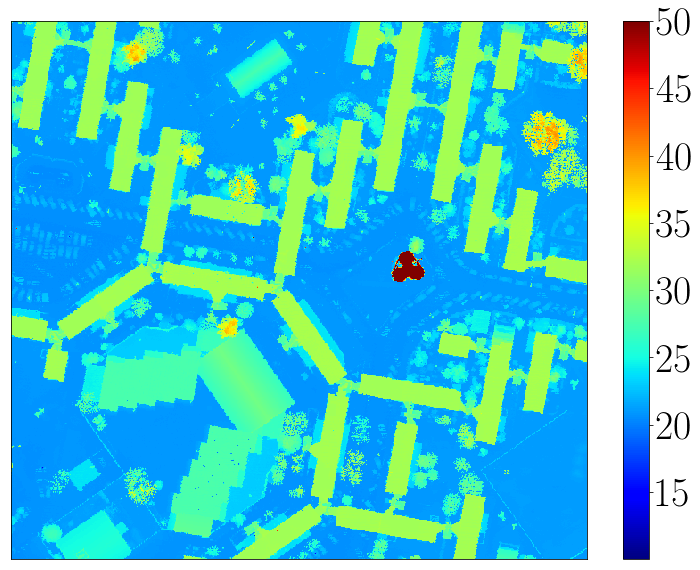

In [10]:
# set experiment directory
input_dir = 'ba_experiments/iccv19/iarpa/iarpa_ba'

# iarpa
vmin, vmax = 10.0000001, 50  #'jet'
f_size=(12.9, 9.9)
color_bar='jet'

#jax161
#vmin,vmax=-27.9,-2
#f_size=(12.1, 9.9)
#color_bar='gist_earth'

from PIL import Image

fig = plt.figure()
params = {'backend': 'pgf',
          'axes.labelsize': 22,
          'ytick.labelleft': False,
          'font.size': 22,
          'legend.fontsize': 22,
          'xtick.labelsize': 22,
          'ytick.labelsize': 22,
          'xtick.top': False,
          'xtick.bottom': False,
          'xtick.labelbottom': False,
          'ytick.left': False,
          'ytick.right': False,   
          'text.usetex': True, # use TeX for text
          'font.family': 'serif',
          'legend.loc': 'upper left',
          'legend.fontsize': 22}
plt.rcParams.update(params)
plt.figure(figsize=f_size)

# reconstructed model
im = np.array(Image.open(input_dir+'/sol_dsm.tif'))
plt.imshow(im.squeeze(), cmap=color_bar, vmin=vmin, vmax=vmax)
plt.axis('equal')
cbar = plt.colorbar()
#cbar.ax.get_yaxis().labelpad = 55
#cbar.ax.set_ylabel('surface height [m]', rotation=270, fontsize=40)
cbar.ax.tick_params(labelsize=40)
#plt.title('Output DSM', fontsize=40)
#plt.savefig('reconstructed_dsm.pgf', pad_inches=0, bbox_inches='tight', dpi=200)
plt.show() 


fig = plt.figure()
params = {'backend': 'pgf',
          'axes.labelsize': 22,
          'ytick.labelleft': False,
          'font.size': 22,
          'legend.fontsize': 22,
          'xtick.labelsize': 22,
          'ytick.labelsize': 22,
          'xtick.top': False,
          'xtick.bottom': False,
          'xtick.labelbottom': False,
          'ytick.left': False,
          'ytick.right': False,   
          'text.usetex': True, # use TeX for text
          'font.family': 'serif',
          'legend.loc': 'upper left',
          'legend.fontsize': 22}
plt.rcParams.update(params)
plt.figure(figsize=f_size)

# ground-truth
im = np.array(Image.open(input_dir+'/gt_dsm3.tif'))
plt.imshow(im.squeeze(), cmap='jet', vmin=vmin, vmax=vmax)
plt.axis('equal')
cbar = plt.colorbar()
#cbar.ax.get_yaxis().labelpad = 55
#cbar.ax.set_ylabel('surface height [m]', rotation=270, fontsize=40)
cbar.ax.tick_params(labelsize=40)
#plt.title('Ground-truth DSM', fontsize=40)
#plt.savefig('groundtruth_dsm.pgf', pad_inches=0, bbox_inches='tight', dpi=200)
plt.show() 

### Plot connectivity graph

Correspondence matrix loaded!


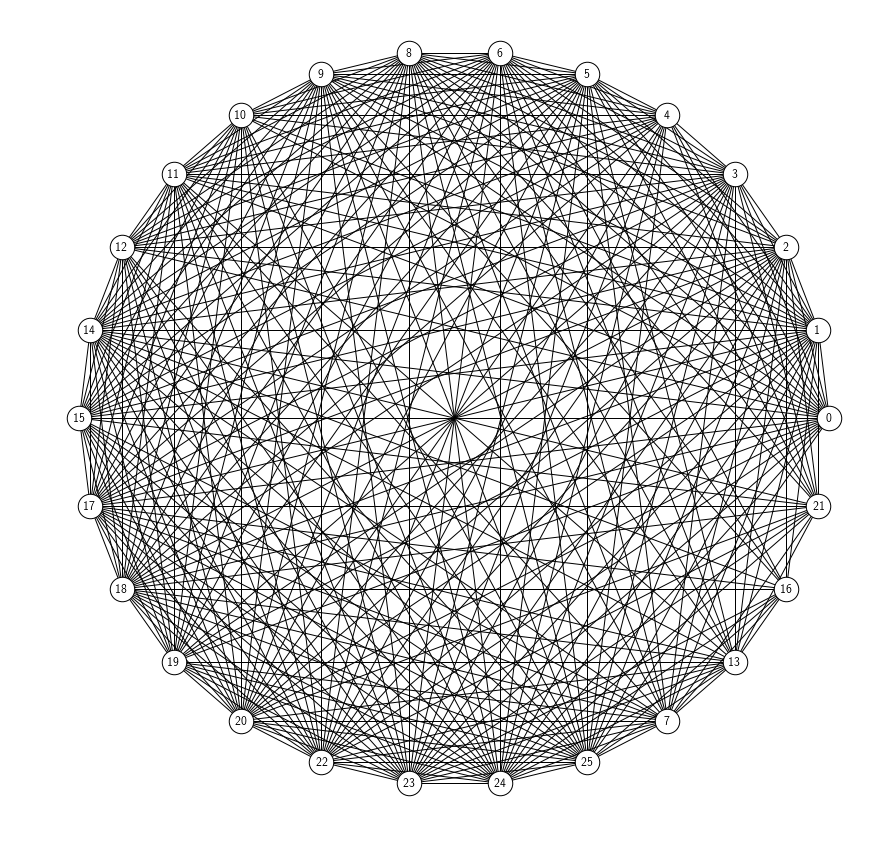

In [59]:
input_dir='ba_experiments/iccv19/jax/jax251_ba_heuristics'

pickle_in = open(input_dir+'/features_after_outlier_removal.pickle','rb')
#pickle_in = open('ba_experiments/iccv19/iarpa/iarpa_ba_heuristics'+'/features_after_outlier_removal.pickle','rb')
Cnew = pickle.load(pickle_in)
#Cnew = np.loadtxt('ba_experiments/report_april19/clean_sift_tracks.txt')
print('Correspondence matrix loaded!')

thr_matches = 60

ba_utils.plot_connectivity_graph(Cnew, thr_matches, save_pgf=True);